<a href="https://colab.research.google.com/github/fcoliveira-utfpr/climate_parana/blob/main/02_characterization_and_spatial_variability_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Start – Libraries
---

In [1]:
# =========================================================
# REQUIRED LIBRARIES
# =========================================================
# -------------------------
# IMPORTS
# -------------------------
!pip install geobr geopandas rasterio elevation cartopy --quiet
import warnings
import math
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from matplotlib import cm, colors
from matplotlib.lines import Line2D
from matplotlib.ticker import FuncFormatter

from geobr import read_municipality

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from geobr import read_municipality
from geobr import read_state

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 338.0/338.0 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 57.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 42.7 MB/s eta 0:00:00


#Spatial distribution of annual climatic variables and climate zones
---

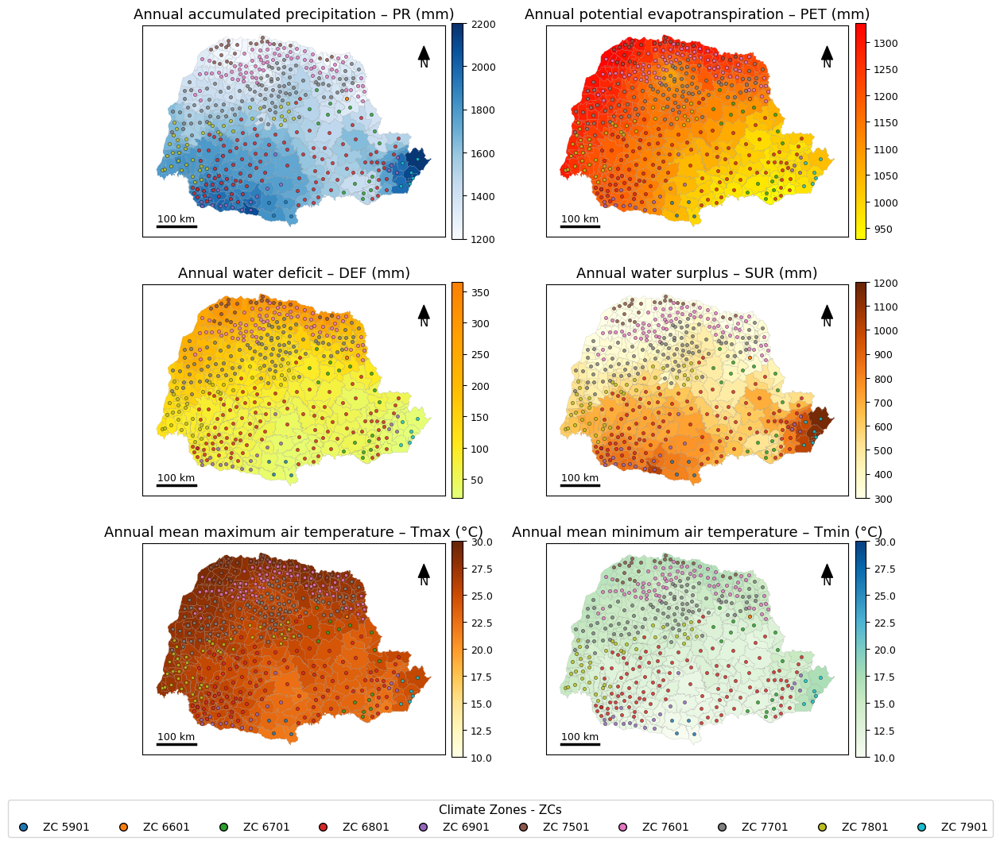

In [ ]:
# =========================================================
# DATA INPUT
# =========================================================
# Load concatenated climatic dataset (continuous variables + climate zones)
url = "https://raw.githubusercontent.com/fcoliveira-utfpr/climate_parana/refs/heads/main/dados_concatenados_zc.csv"
df = pd.read_csv(url, sep=",")

# =========================================================
# CLIMATIC MULTIPLOT – PARANÁ STATE
# CONTINUOUS MAPS + CLIMATE ZONES
# =========================================================

# ---------------------------------------------------------
# SUPPRESS WARNINGS
# ---------------------------------------------------------
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# ---------------------------------------------------------
# AUXILIARY FUNCTIONS
# ---------------------------------------------------------
def fmt_factory(fmt):
    """
    Creates a formatter for colorbar tick labels.
    """
    return FuncFormatter(lambda x, pos: fmt % x)


def add_north_arrow(ax, x=0.93, y=0.9, size=0.08):
    """
    Adds a north arrow to the map.
    Coordinates are given in axes fraction units.
    """
    ax.annotate(
        'N',
        xy=(x, y),
        xytext=(x, y - size),
        arrowprops=dict(facecolor='black', width=3, headwidth=10),
        ha='center',
        va='center',
        fontsize=11,
        xycoords=ax.transAxes
    )


def add_scalebar(ax, length_km=100, loc=(0.05, 0.05), linewidth=2.5):
    """
    Adds an approximate scale bar (valid for Paraná latitude range).
    Conversion assumes 1° ≈ 111 km.
    """
    x0, y0 = loc
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    length_deg = length_km / 111.0  # Approximation for southern Brazil

    x_start = xlim[0] + x0 * (xlim[1] - xlim[0])
    y_start = ylim[0] + y0 * (ylim[1] - ylim[0])

    ax.plot(
        [x_start, x_start + length_deg],
        [y_start, y_start],
        color='black',
        linewidth=linewidth,
        zorder=20
    )

    ax.text(
        x_start + length_deg / 2,
        y_start + 0.01 * (ylim[1] - ylim[0]),
        f"{length_km} km",
        ha='center',
        va='bottom',
        fontsize=9
    )


# ---------------------------------------------------------
# VARIABLE SPECIFICATIONS
# ---------------------------------------------------------
VAR_SPECS = {

    # Annual accumulated precipitation
    'pr': dict(
        title="Annual accumulated precipitation – PR",
        unit="mm",
        cmap='Blues',
        vmin=1200,
        vmax=2200,
        fmt="%.0f"
    ),

    # Annual potential evapotranspiration
    'pet': dict(
        title="Annual potential evapotranspiration – PET",
        unit="mm",
        cmap='autumn_r',
        vmin=930,
        vmax=1336,
        fmt="%.0f"
    ),

    # Annual water deficit
    'def': dict(
        title="Annual water deficit – DEF",
        unit="mm",
        cmap='Wistia',
        vmin=20,
        vmax=365,
        fmt="%.0f"
    ),

    # Annual water surplus
    'ro': dict(
        title="Annual water surplus – SUR",
        unit="mm",
        cmap='YlOrBr',
        vmin=300,
        vmax=1200,
        fmt="%.0f"
    ),

    # Annual mean maximum air temperature
    'tmmx': dict(
        title="Annual mean maximum air temperature – Tmax",
        unit="°C",
        cmap='YlOrBr',
        vmin=10,
        vmax=30,
        fmt="%.1f"
    ),

    # Annual mean minimum air temperature
    'tmmn': dict(
        title="Annual mean minimum air temperature – Tmin",
        unit="°C",
        cmap='GnBu',
        vmin=10,
        vmax=30,
        fmt="%.1f"
    ),
}

vars_plot = list(VAR_SPECS.keys())

# ---------------------------------------------------------
# CLIMATE ZONE COLORS
# ---------------------------------------------------------
ZC_COLORS = [
    'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple',
    'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan'
]


# ---------------------------------------------------------
# CLIMATE ZONES (SORTED ORDER)
# ---------------------------------------------------------
zonas = sorted(df['ZC'].dropna().unique(), key=lambda x: str(x))

if len(zonas) > len(ZC_COLORS):
    raise ValueError("Number of climate zones exceeds available color list.")

zona_color = {z: ZC_COLORS[i] for i, z in enumerate(zonas)}


# ---------------------------------------------------------
# PARANÁ MUNICIPALITIES (IBGE – geobr)
# ---------------------------------------------------------
mun_pr = read_municipality(code_muni="PR", year=2020)

# Standardize municipality names for merging
mun_pr['municipio'] = (
    mun_pr['name_muni']
    .str.upper()
    .str.normalize('NFKD')
    .str.encode('ascii', errors='ignore')
    .str.decode('utf-8')
)

# ---------------------------------------------------------
# FIGURE LAYOUT
# ---------------------------------------------------------
n_vars = len(vars_plot)
ncols = 2
nrows = math.ceil(n_vars / ncols)

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(12, 4 * nrows)
)

axes = axes.flatten()

# ---------------------------------------------------------
# MAIN LOOP – GENERATE EACH MAP
# ---------------------------------------------------------
for i, variavel in enumerate(vars_plot):

    ax = axes[i]
    spec = VAR_SPECS[variavel]

    # Filter variable
    df_var = df[df['variavel'] == variavel].copy()

    # Standardize municipality names
    df_var['municipio'] = (
        df_var['municipio']
        .str.upper()
        .str.normalize('NFKD')
        .str.encode('ascii', errors='ignore')
        .str.decode('utf-8')
    )

    # Merge spatial + climatic data
    gdf_pr = mun_pr.merge(df_var, on='municipio', how='left')

    # --- CONTINUOUS MAP
    gdf_pr.plot(
        column='valor',
        cmap=spec['cmap'],
        vmin=spec['vmin'],
        vmax=spec['vmax'],
        linewidth=0.10,
        edgecolor='0.5',
        ax=ax
    )

    # --- COLORBAR
    norm = colors.Normalize(vmin=spec['vmin'], vmax=spec['vmax'])
    sm = cm.ScalarMappable(norm=norm, cmap=plt.get_cmap(spec['cmap']))
    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        ax=ax,
        fraction=0.08,
        pad=0.02,
        shrink=1.0,
        format=fmt_factory(spec['fmt'])
    )
    cbar.ax.tick_params(labelsize=9)

    # --- COMPUTE CENTROIDS (PROJECTED CRS FOR ACCURACY)
    gdf_pr = gdf_pr.to_crs(epsg=5880)
    gdf_pr['centroid'] = gdf_pr.geometry.centroid
    gdf_pr = gdf_pr.to_crs(epsg=4674)

    # --- PLOT CLIMATE ZONE POINTS
    for z in zonas:
        sub = gdf_pr[gdf_pr['ZC'] == z]
        if sub.empty:
            continue

        ax.scatter(
            sub.centroid.x,
            sub.centroid.y,
            s=9,
            color=zona_color[z],
            edgecolor='black',
            linewidth=0.3,
            alpha=0.85,
            zorder=10
        )

    # --- CARTOGRAPHIC ELEMENTS
    add_scalebar(ax, length_km=100)
    add_north_arrow(ax)

    ax.set_title(f"{spec['title']} ({spec['unit']})", fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])

# ---------------------------------------------------------
# REMOVE EMPTY SUBPLOTS
# ---------------------------------------------------------
for j in range(i + 1, len(axes)):
    axes[j].axis('off')


# ---------------------------------------------------------
# SINGLE LEGEND FOR CLIMATE ZONES
# ---------------------------------------------------------
legend_elements = [
    Line2D(
        [0], [0],
        marker='o',
        color='none',
        label=f'ZC {z}',
        markerfacecolor=zona_color[z],
        markeredgecolor='black',
        markersize=7
    )
    for z in zonas
]

fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=len(zonas),
    frameon=True,
    title='Climate Zones - ZCs',
    title_fontsize=11,
    fontsize=10,
    bbox_to_anchor=(0.5, 0.02)
)
# ---------------------------------------------------------
# EXPORT
# ---------------------------------------------------------
plt.savefig("Figure3.png", dpi=600, bbox_inches='tight')

plt.show()

##BoxPlot by ZC

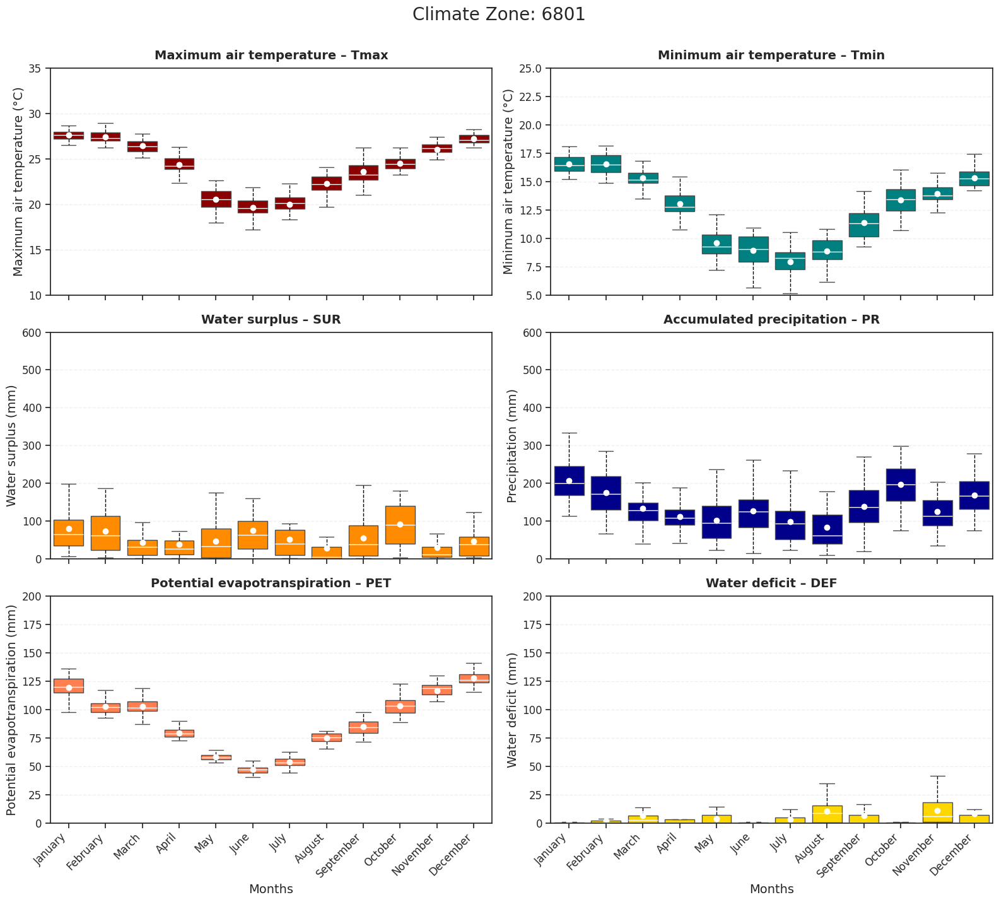

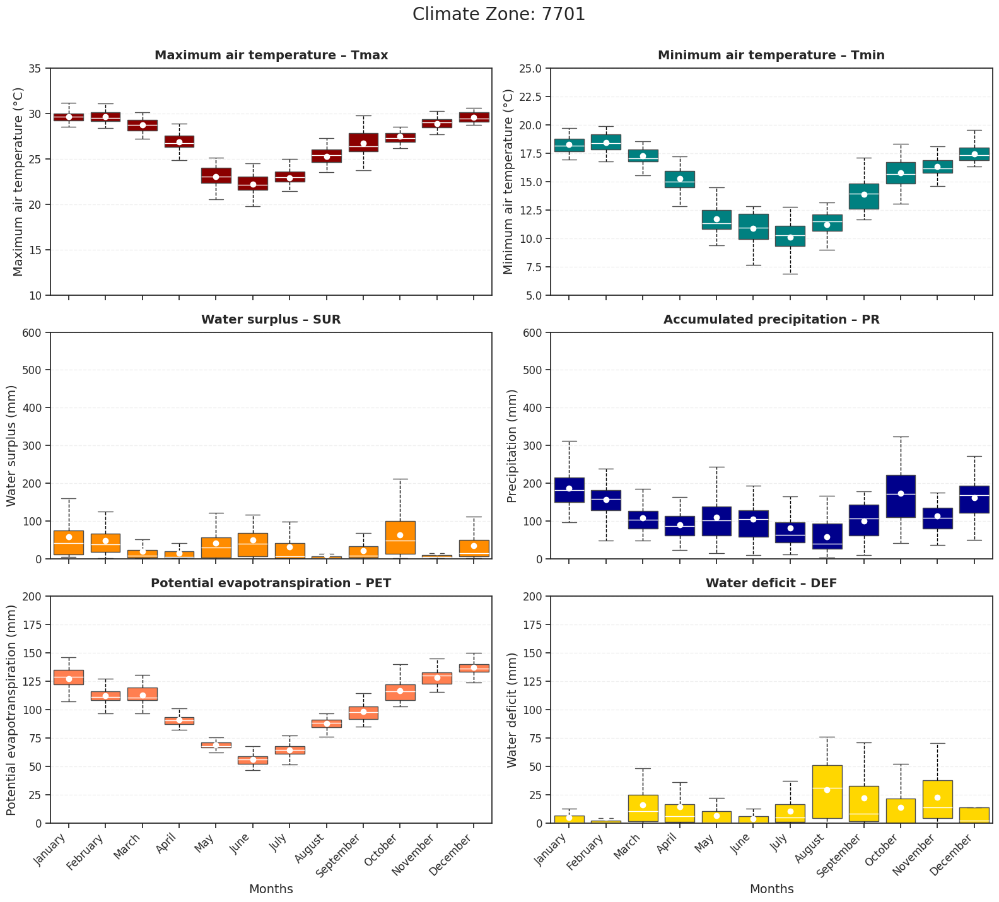

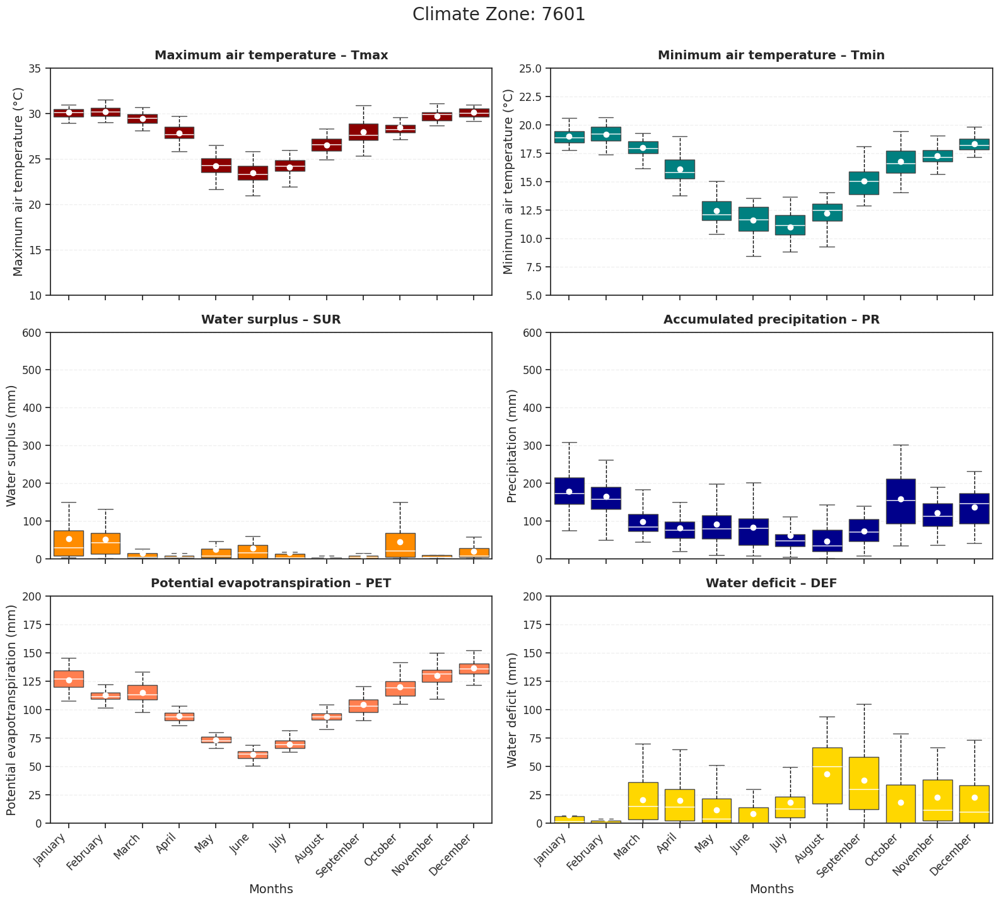

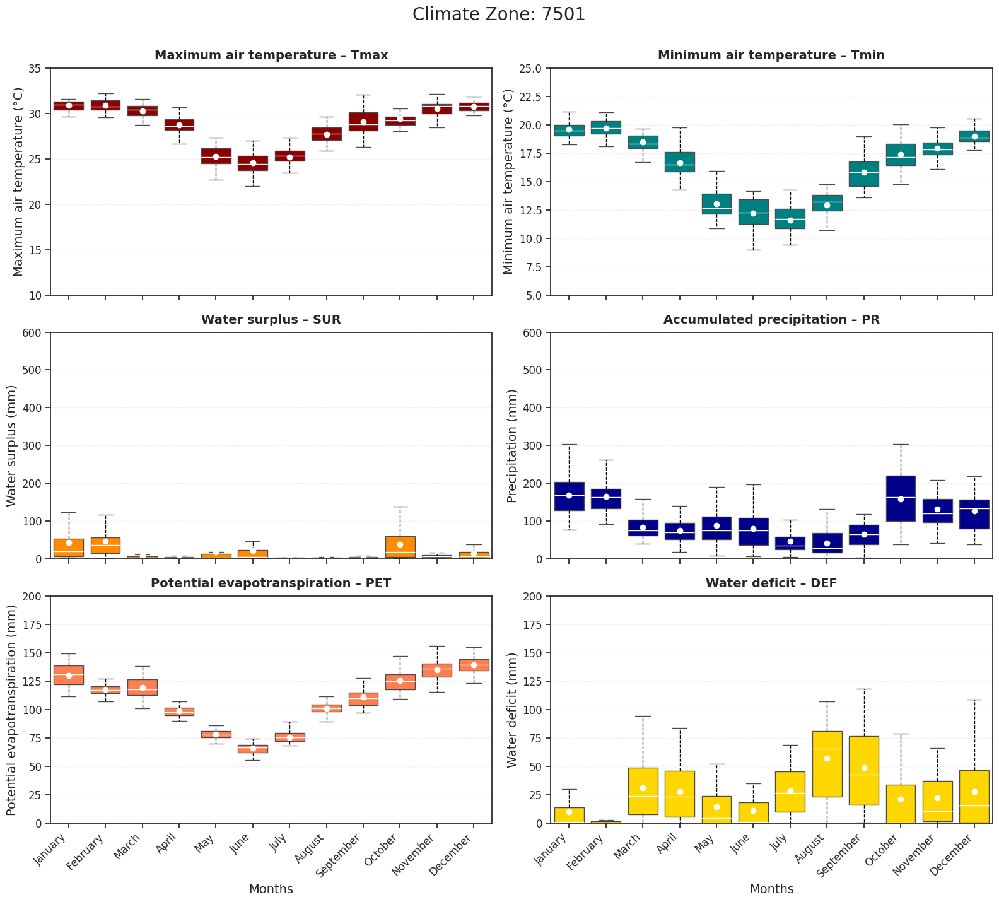

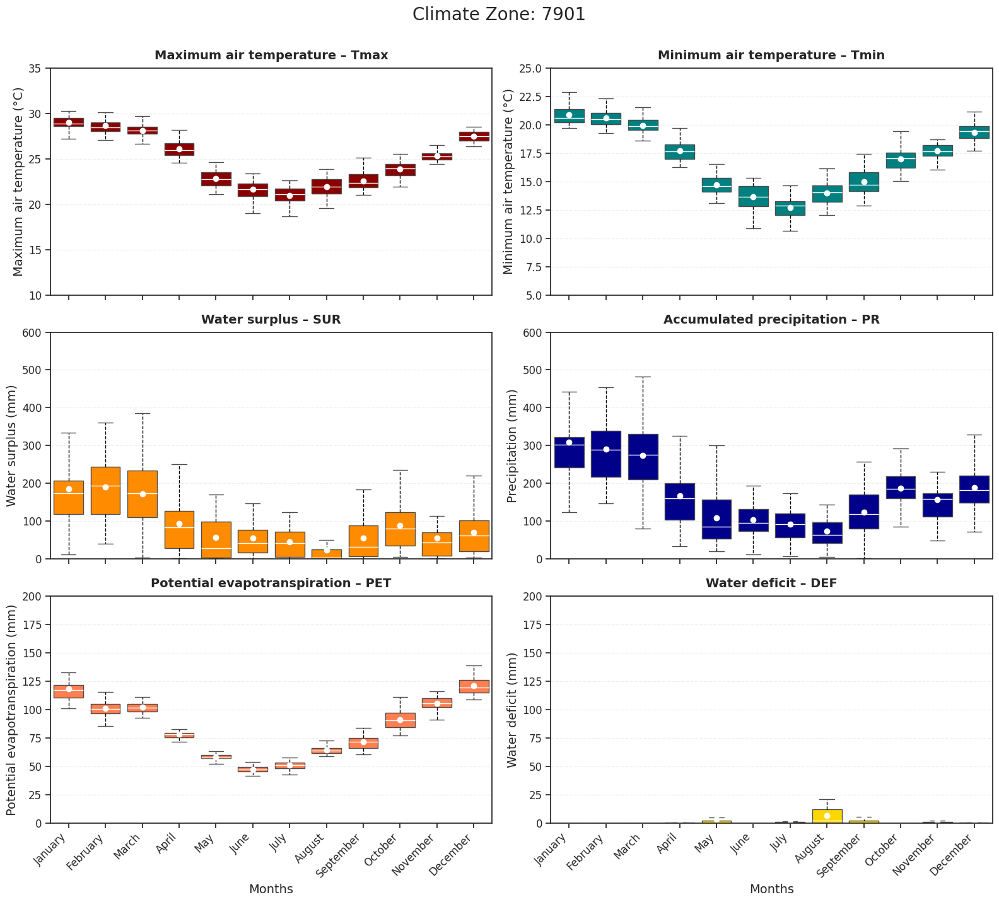

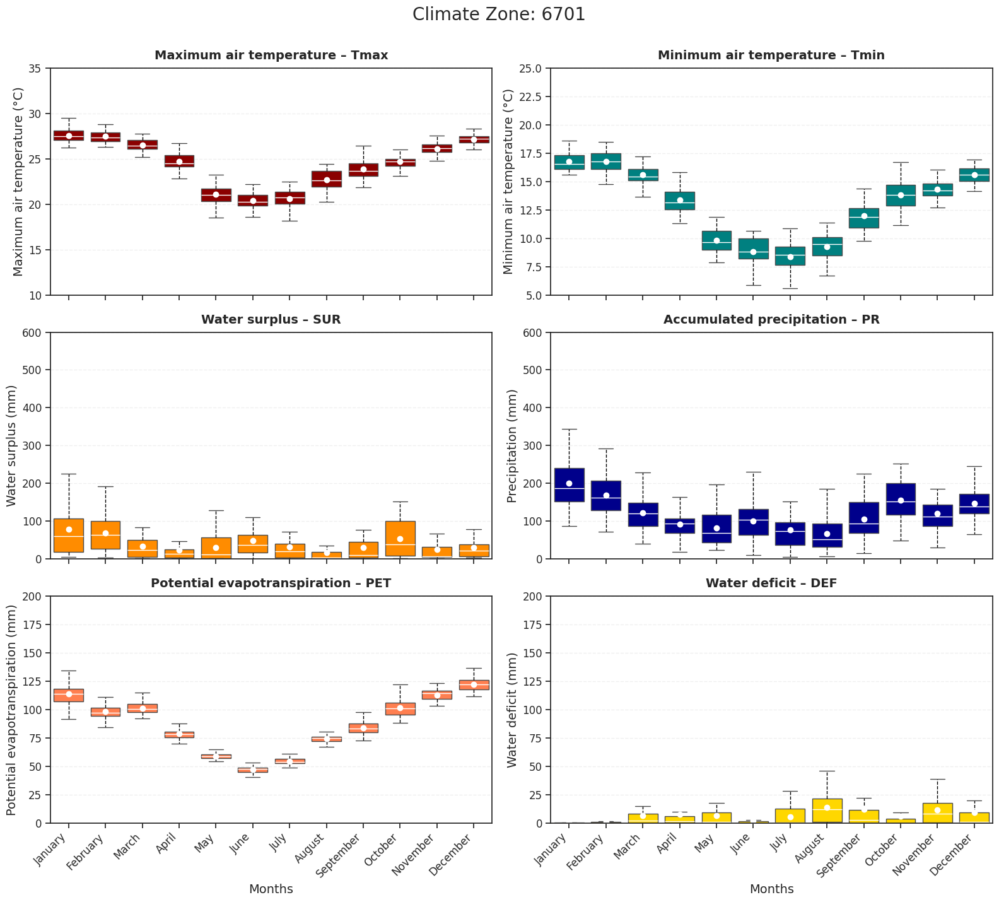

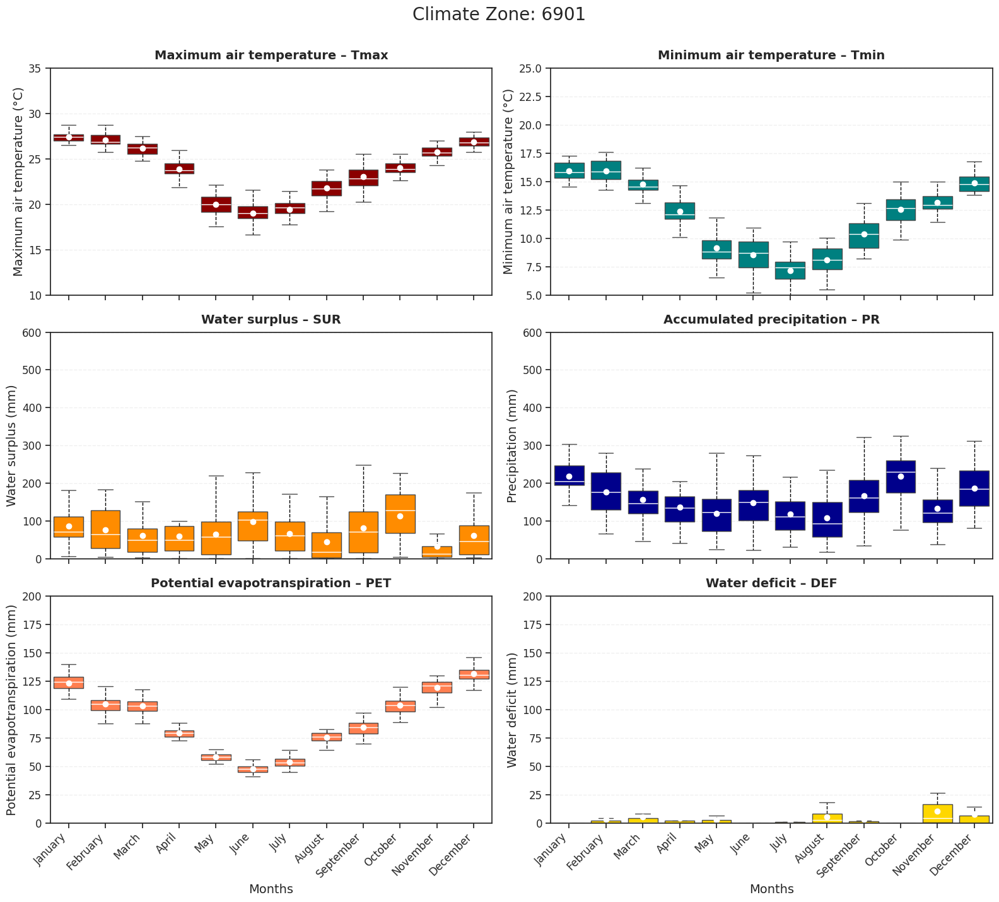

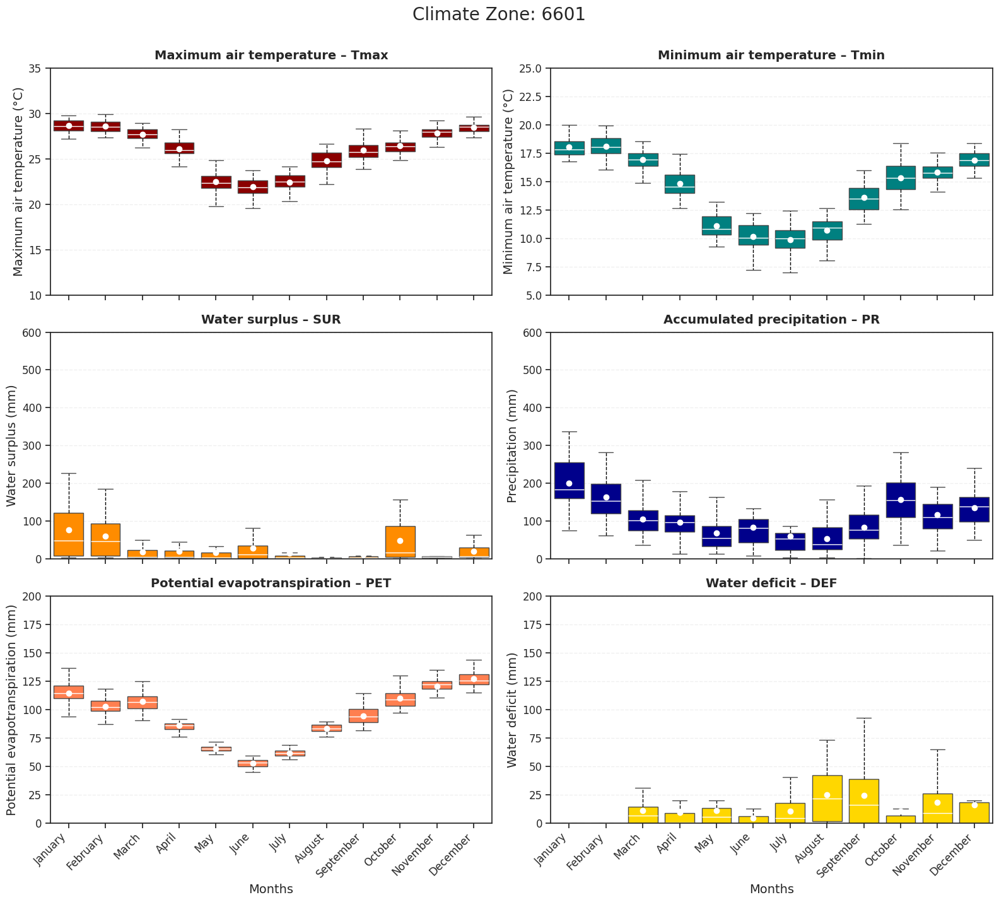

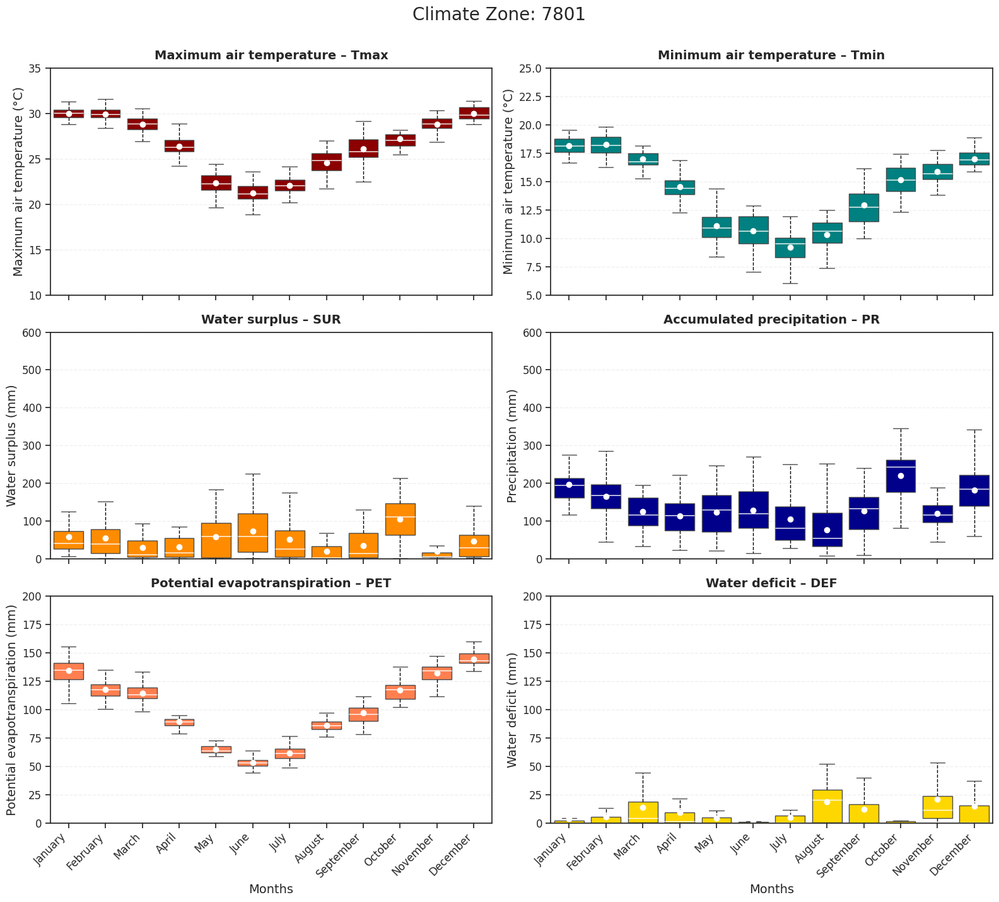

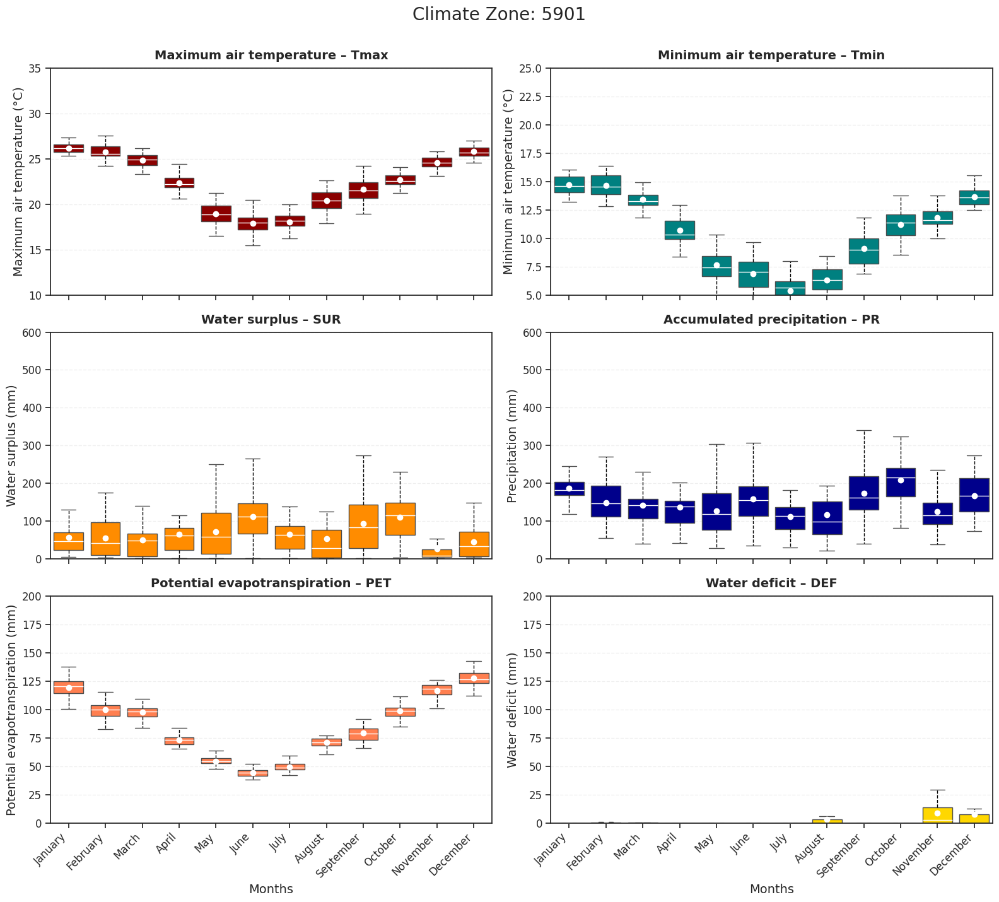

In [ ]:

# List of spreadsheet IDs
numeros_planilhas = [6801, 7701, 7601, 7501, 7901, 6701, 6901, 6601, 7801, 5901]


# =========================================================
# LOOP THROUGH EACH CLIMATE ZONE FILE
# =========================================================
for planilha in numeros_planilhas:

    # Convert numeric ID to string to build file name
    nome_da_planilha = str(planilha)

    # Load CSV directly from GitHub
    url = f"https://raw.githubusercontent.com/fcoliveira-utfpr/climate_parana/refs/heads/main/{nome_da_planilha}.csv"
    df = pd.read_csv(url)

    # Store variable column temporarily
    variavel = df['variavel']

    # Remove variable column for numeric conversion
    df = df.drop(columns=['variavel'])

    # Replace comma decimal separators with dot
    df = df.replace({',': '.'}, regex=True)

    # Convert all values to numeric
    df = df.apply(lambda x: pd.to_numeric(x, errors='coerce'), axis=1)

    # Restore variable column
    df['variavel'] = variavel

    # Climate zone identifier
    zona = planilha

    # -----------------------------------------------------
    # List of variables to be plotted
    # -----------------------------------------------------
    variaveis = ['def', 'pet', 'pr', 'ro', 'tmmn', 'tmmx']

    # Create separate DataFrames for each variable
    dfs = {}
    for variavel in variaveis:
        df_filtrado = df[df['variavel'] == variavel]
        df_filtrado = df_filtrado[['ano', 'mes', 'media', 'min', 'max', 'desvio']]
        dfs[variavel] = df_filtrado

    # -----------------------------------------------------
    # Seaborn configuration
    # -----------------------------------------------------
    sns.set()
    sns.set_style('ticks')

    # -----------------------------------------------------
    # Month labels (Portuguese → numeric mapping)
    # -----------------------------------------------------
    mes_labels = [
        "January", "February", "March", "April", "May", "June",
        "July", "August", "September", "October", "November", "December"
    ]

    mes_map = {m: i + 1 for i, m in enumerate(mes_labels)}

    # -----------------------------------------------------
    # Variable limits dictionary (standardized axis range)
    # -----------------------------------------------------
    LIMITES_VARIAVEIS = {
        'tmmx': {"vmin": 10, "vmax": 35},   # Maximum temperature
        'tmmn': {"vmin": 5,  "vmax": 25},   # Minimum temperature
        'ro':   {"vmin": 0,  "vmax": 600},  # Water surplus
        'pr':   {"vmin": 0,  "vmax": 600},  # Precipitation
        'pet':  {"vmin": 0,  "vmax": 200},  # Potential evapotranspiration
        'def':  {"vmin": 0,  "vmax": 200},  # Water deficit
    }

    # -----------------------------------------------------
    # Helper functions
    # -----------------------------------------------------
    def _coerce_month_col(df, col='mes'):
        """
        Converts month column to numeric format if necessary.
        """
        s = df[col]
        if pd.api.types.is_numeric_dtype(s):
            m = s.astype(int)
        else:
            m = s.map(mes_map)
        return df.assign(_mes=m)

    def _order_present(d):
        """
        Returns sorted list of months present in the dataset.
        """
        present = sorted([int(x) for x in pd.unique(d['_mes'].dropna())])
        return present

    def _xticks_from_order(ax, order):
        """
        Configure x-axis ticks based on available months.
        """
        labels = [mes_labels[i - 1] for i in order]
        ax.set_xticks(range(len(order)))
        ax.set_xticklabels(labels, rotation=45, ha='right')

    def _box_mean(ax, df, facecolor, ylabel, vmin=None, vmax=None):
        """
        Creates boxplot with highlighted mean and custom axis limits.
        """

        # Convert month column
        d = _coerce_month_col(df).dropna(subset=['_mes', 'media'])

        # Order months
        ord_present = _order_present(d)

        # Define categorical order
        d = d.assign(
            _mes_cat=pd.Categorical(d['_mes'], categories=ord_present, ordered=True)
        )

        # Create boxplot
        sns.boxplot(
            data=d, x='_mes_cat', y='media',
            showcaps=True, showfliers=False,
            boxprops=dict(facecolor=facecolor),
            medianprops=dict(color='white', linewidth=1),
            whiskerprops=dict(color='black', linewidth=1, linestyle='dashed'),
            ax=ax
        )

        # Add mean points
        sns.pointplot(
            data=d, x='_mes_cat', y='media',
            estimator='mean', errorbar=None,
            markers="o", markersize=5,
            linestyles='',
            color='white', ax=ax
        )

        # Apply y-axis limits
        if vmin is not None and vmax is not None:
            ax.set_ylim(vmin, vmax)

        # Axis labels
        ax.set_xlabel("Months", fontsize=14)
        ax.set_ylabel(ylabel, fontsize=14)

        # X-axis formatting
        _xticks_from_order(ax, ord_present)

        ax.tick_params(axis='y', labelsize=12)
        ax.tick_params(axis='x', labelsize=12)

        # Add horizontal grid
        ax.grid(True, axis='y', alpha=0.3, linestyle='--')


    # -----------------------------------------------------
    # Panel configuration
    # -----------------------------------------------------
    panels = [
        {
            "df": dfs['tmmx'],
            "color": "darkred",
            "ylabel": "Maximum air temperature (°C)",
            "title": "Maximum air temperature – Tmax",
            "vmin": LIMITES_VARIAVEIS['tmmx']['vmin'],
            "vmax": LIMITES_VARIAVEIS['tmmx']['vmax']
        },
        {
            "df": dfs['tmmn'],
            "color": "teal",
            "ylabel": "Minimum air temperature (°C)",
            "title": "Minimum air temperature – Tmin",
            "vmin": LIMITES_VARIAVEIS['tmmn']['vmin'],
            "vmax": LIMITES_VARIAVEIS['tmmn']['vmax']
        },
        {
            "df": dfs['ro'],
            "color": "darkorange",
            "ylabel": "Water surplus (mm)",
            "title": "Water surplus – SUR",
            "vmin": LIMITES_VARIAVEIS['ro']['vmin'],
            "vmax": LIMITES_VARIAVEIS['ro']['vmax']
        },
        {
            "df": dfs['pr'],
            "color": "darkblue",
            "ylabel": "Precipitation (mm)",
            "title": "Accumulated precipitation – PR",
            "vmin": LIMITES_VARIAVEIS['pr']['vmin'],
            "vmax": LIMITES_VARIAVEIS['pr']['vmax']
        },
        {
            "df": dfs['pet'],
            "color": "coral",
            "ylabel": "Potential evapotranspiration (mm)",
            "title": "Potential evapotranspiration – PET",
            "vmin": LIMITES_VARIAVEIS['pet']['vmin'],
            "vmax": LIMITES_VARIAVEIS['pet']['vmax']
        },
        {
            "df": dfs['def'],
            "color": "gold",
            "ylabel": "Water deficit (mm)",
            "title": "Water deficit – DEF",
            "vmin": LIMITES_VARIAVEIS['def']['vmin'],
            "vmax": LIMITES_VARIAVEIS['def']['vmax']
        },
    ]


    # -----------------------------------------------------
    # Create 3x2 figure layout
    # -----------------------------------------------------
    fig, axes = plt.subplots(3, 2, figsize=(16, 14))
    axes_flat = axes.ravel()

    # Generate each subplot
    for ax, cfg in zip(axes_flat, panels):
        _box_mean(
            ax, cfg["df"], cfg["color"], cfg["ylabel"],
            vmin=cfg["vmin"], vmax=cfg["vmax"]
        )
        ax.set_title(cfg["title"], fontsize=14, fontweight='bold', pad=10)

    # Hide month labels for first two rows
    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            ax.tick_params(axis='x', labelbottom=False)
            ax.set_xlabel("")

    # Show month labels only in last row
    for j in range(2):
        ax = axes[2, j]
        ax.tick_params(axis='x', labelbottom=True)
        ax.set_xlabel("Months", fontsize=14)

    # Global figure title
    fig.suptitle(f'Climate Zone: {zona}', fontsize=20, y=1.02)

    # Layout adjustment
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)

    # Display figure
    plt.show()

    # Save figure (optional)
    fig.savefig(
        f'climate_analysis_zone_{zona}.png',
        dpi=300,
        bbox_inches='tight'
    )

    # Close figure to free memory
    plt.close(fig)


#Analysis of the ZCs
---

In [ ]:
# =========================================================
# LOAD DATA
# =========================================================
# Read the concatenated climate dataset from GitHub
url = "https://raw.githubusercontent.com/fcoliveira-utfpr/climate_parana/refs/heads/main/dados_concatenados_zc.csv"
df = pd.read_csv(url, sep=",")


# =========================================================
# GROUPED STATISTICS BY CLIMATE ZONE (ZC) AND VARIABLE
# =========================================================
# Calculate mean and standard deviation of each climatic variable
# grouped by Climate Zone (ZC)
resultado = (
    df
    .groupby(['ZC', 'variavel'])['valor']
    .agg(['mean', 'std'])     # Compute mean and standard deviation
    .unstack('variavel')      # Pivot variables into columns
)

resultado


# =========================================================
# FLATTEN MULTI-LEVEL COLUMN NAMES
# =========================================================
# After unstacking, columns become multi-index (statistic, variable).
# This step converts them into single-level column names,
# e.g., pr_mean, pr_std, tmmx_mean, tmmx_std.
resultado.columns = [
    f'{var}_{stat}' for stat, var in resultado.columns
]


# =========================================================
# RESET INDEX
# =========================================================
# Move ZC from index to a regular column
resultado = resultado.reset_index()

resultado


,ZC,def_mean,pet_mean,pr_mean,ro_mean,tmmn_mean,tmmx_mean,def_std,pet_std,pr_std,ro_std,tmmn_std,tmmx_std
0,5901,32.307809,1027.572833,1799.176621,803.085829,10.458622,22.414912,5.587111,28.765803,47.134148,24.348398,0.471511,0.471409
1,6601,139.288702,1122.242573,1315.443174,334.058025,14.141721,25.940854,4.391654,1.413138,11.893311,12.055734,0.052717,0.150034
2,6701,76.640853,1029.586004,1435.114490,481.214203,12.719764,24.118362,31.204035,74.223380,43.752601,67.709384,0.789954,1.180774
3,6801,65.301483,1087.933679,1711.971350,688.645396,12.599154,24.380985,21.246359,84.436677,137.469748,93.310647,0.707229,1.159792
4,6901,52.141434,1107.771204,1928.524269,872.583468,12.069181,24.108070,17.113930,76.941063,87.642753,76.391832,1.208979,0.950446
5,7501,308.842164,1300.264259,1227.211355,236.146553,16.307616,28.681586,25.788860,23.579486,27.789655,19.114700,0.375236,0.269955
6,7601,229.418138,1224.091089,1296.896825,302.260516,15.485108,27.559608,42.899048,54.249502,48.028431,31.399227,0.646809,0.762362
7,7701,159.633022,1186.662218,1442.097708,414.310280,14.602447,26.626299,29.003340,57.090190,84.648541,56.806299,0.657047,0.738926
8,7801,117.255449,1212.486376,1677.262115,581.317280,14.203582,26.527637,18.527245,45.259859,108.614400,78.760244,0.624872,0.630700
9,7901,24.031643,1000.477791,2067.184591,1090.274242,17.105864,24.777153,3.873904,20.956861,84.633295,77.305140,0.527617,0.492306


In [ ]:
resultado.to_excel("resultado.xlsx", index=False)

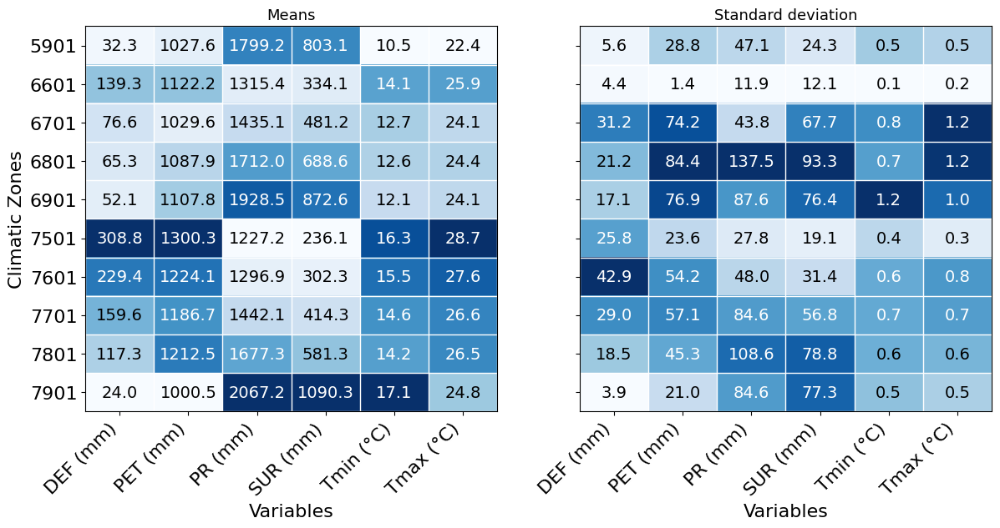

In [ ]:
# =========================================================
# BASIC PARAMETERS
# =========================================================
# Base climatic variables
vars_base = ["def", "pet", "pr", "ro", "tmmn", "tmmx"]

# Metrics to be displayed (order of panels)
metrics = ["mean", "std"]

# Panel titles
titles = {
    "mean": "Means",
    "std": "Standard deviation"
}

# =========================================================
# PREPARE MATRICES BY METRIC
# =========================================================
# Sort climate zones and set as index
df_sorted = resultado.set_index("ZC").sort_index()

# Dictionary: metric -> matrix (rows = climate zones, columns = variables)
mats = {
    m: df_sorted[[f"{v}_{m}" for v in vars_base]]
    for m in metrics
}

# =========================================================
# CREATE 1x2 FIGURE
# =========================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True, sharex=True)

for i, (ax, m) in enumerate(zip(axes.flatten(), metrics)):

    # Convert DataFrame to NumPy matrix
    mat = mats[m].to_numpy()

    # -----------------------------------------------------
    # COLUMN-WISE NORMALIZATION (each variable independently)
    # -----------------------------------------------------
    mat_normalized = np.zeros_like(mat)

    for col in range(mat.shape[1]):

        col_data = mat[:, col]
        vmin_col = np.min(col_data)
        vmax_col = np.max(col_data)

        # Normalize each column between 0 and 1
        if vmax_col != vmin_col:
            mat_normalized[:, col] = (
                (col_data - vmin_col) /
                (vmax_col - vmin_col)
            )
        else:
            # If column is constant, assign neutral value
            mat_normalized[:, col] = 0.5

    # -----------------------------------------------------
    # APPLY COLOR MAP (Blues)
    # -----------------------------------------------------
    colors = plt.cm.Blues(mat_normalized)

    # Display as image
    im = ax.imshow(colors, aspect="auto")

    ax.set_title(titles[m], fontsize=13)

    # -----------------------------------------------------
    # ADD NUMERIC VALUES INSIDE EACH CELL
    # -----------------------------------------------------
    for j in range(len(mats[m].index)):
        for k in range(len(vars_base)):

            # Normalized value (used only for text contrast)
            val_norm = mat_normalized[j, k]

            # White text on dark cells, black on light cells
            text_color = "black" if val_norm < 0.5 else "white"

            ax.text(
                k, j,
                f"{mat[j, k]:.1f}",
                ha="center",
                va="center",
                color=text_color,
                fontsize=14
            )

    # -----------------------------------------------------
    # X-AXIS LABELS
    # -----------------------------------------------------
    ax.set_xticks(np.arange(len(vars_base)))
    ax.set_xticklabels(
        ["DEF (mm)", "PET (mm)", "PR (mm)", "SUR (mm)", "Tmin (°C)", "Tmax (°C)"],
        rotation=45,
        ha="right",
        fontsize=16
    )

    ax.set_xlabel("Variables", fontsize=16)

    # Show Y label only in the first subplot
    if i == 0:
        ax.set_ylabel("Climatic Zones", fontsize=16)
    else:
        ax.set_ylabel("")

    # -----------------------------------------------------
    # Y-AXIS LABELS (Climate Zones)
    # -----------------------------------------------------
    ax.set_yticks(np.arange(len(mats[m].index)))
    ax.set_yticklabels(
        mats[m].index.astype(str),
        fontsize=16
    )


    # -----------------------------------------------------
    # ADD WHITE GRID LINES TO DELIMIT CELLS
    # -----------------------------------------------------
    for j in range(len(mats[m].index) + 1):
        ax.axhline(j - 0.5, color='white', linewidth=1)

    for k in range(len(vars_base) + 1):
        ax.axvline(k - 0.5, color='white', linewidth=1)

# ---------------------------------------------------------
# FINAL LAYOUT ADJUSTMENT
# ---------------------------------------------------------

# ---------------------------------------------------------
# SAVE FIGURE
# ---------------------------------------------------------
plt.savefig("Figure4.png", dpi=600, bbox_inches="tight")

plt.show()


#Hydroclimatic and thermal characterization
---

In [2]:
# =========================================================
# LOAD DATA
# =========================================================
# Read the concatenated climate dataset from GitHub
url = "https://raw.githubusercontent.com/fcoliveira-utfpr/climate_parana/refs/heads/main/dados_concatenados_zc.csv"
df = pd.read_csv(url, sep=",")


# =========================================================
# STANDARDIZE VARIABLE NAMES
# =========================================================
df['variavel'] = df['variavel'].str.lower()


# =========================================================
# PIVOT DATA TO WIDE FORMAT
# =========================================================
# Convert the dataset from long format to wide format.
# Each climatic variable becomes a separate column.
# The index is defined by state, municipality, coordinates, and climate zone.
df_clima = (
    df.pivot_table(
        index=['estado', 'municipio', 'lat', 'lon', 'ZC'],  # grouping keys
        columns='variavel',                                  # variables become columns
        values='valor',                                      # values to aggregate
        aggfunc='mean'                                       # average if duplicates exist
    )
    .reset_index()
)

# Preview the resulting wide-format DataFrame
df_clima


variavel,estado,municipio,lat,lon,ZC,def,pet,pr,ro,tmmn,tmmx
0,Parana,ABATIA,-23.311363,-50.306176,7601,210.718086,1206.659398,1307.379253,311.556630,15.127665,27.081352
1,Parana,ADRIANOPOLIS,-24.781986,-48.819381,6801,54.045608,1013.932958,1505.512165,544.547239,15.256973,25.303699
2,Parana,AGUDOS DO SUL,-26.025501,-49.309155,6801,33.173108,932.795928,1568.640344,668.200648,12.061930,21.940224
3,Parana,ALMIRANTE TAMANDARE,-25.284879,-49.322794,6801,35.327444,971.290520,1749.590688,812.798507,12.630313,22.602725
4,Parana,ALTAMIRA DO PARANA,-24.812720,-52.691907,6801,99.582733,1164.608342,1673.702794,607.913095,14.157846,25.949021
...,...,...,...,...,...,...,...,...,...,...,...
395,Parana,VERE,-25.877241,-52.961226,6801,70.296891,1167.888375,1899.380348,801.242683,12.239027,25.618214
396,Parana,VIRMOND,-25.408510,-52.236439,6801,64.428900,1113.975685,1758.946594,708.782585,12.586449,24.368879
397,Parana,VITORINO,-26.277366,-52.804057,6901,57.569478,1152.664105,1954.722526,859.303535,11.191796,24.684439
398,Parana,WENCESLAU BRAZ,-23.853953,-49.783944,7601,171.988728,1128.042085,1250.465954,293.374888,14.551194,25.967448


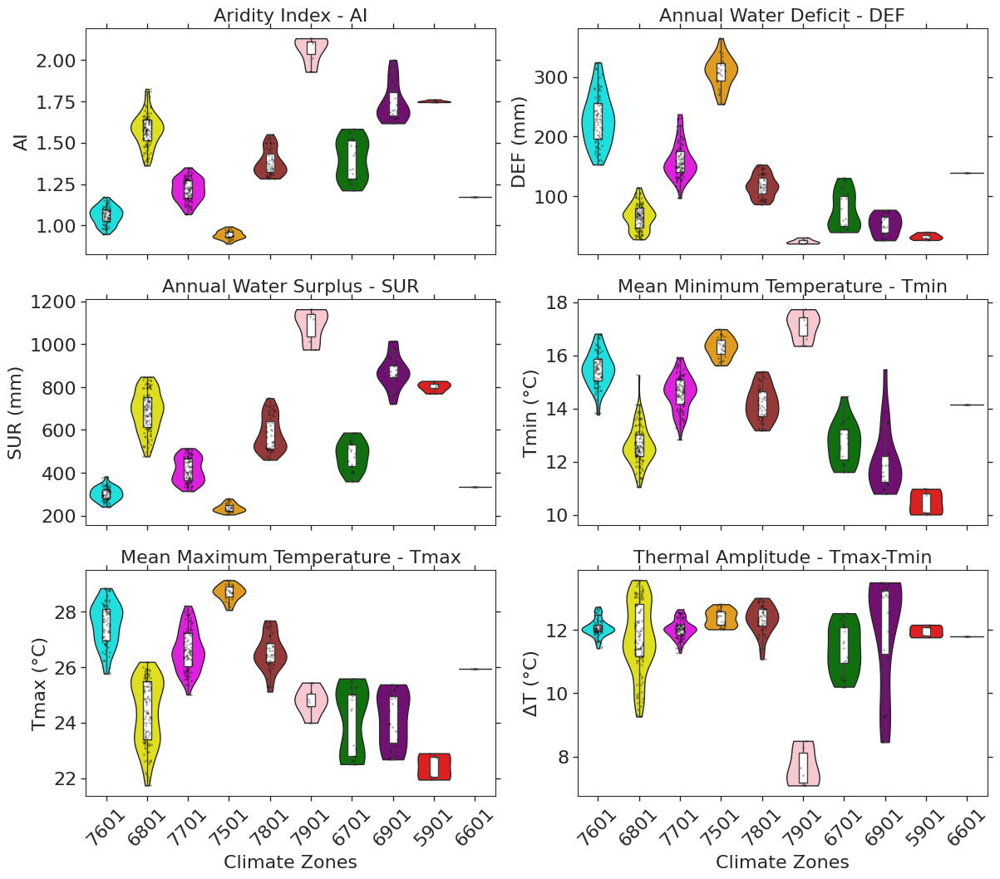

In [3]:
# =========================================================
# STYLE CONFIGURATION
# =========================================================
sns.set_style("ticks")

plt.rcParams.update({
    'font.size': 16,
    'axes.titlesize': 16,
    'axes.labelsize': 16,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16
})

# =========================================================
# PREPARE DATA
# =========================================================
df_plot = df_clima.copy()

df_plot["AI"] = df_plot["pr"] / df_plot["pet"]
df_plot["SUR"] = df_plot["ro"]
df_plot["dT"] = df_plot["tmmx"] - df_plot["tmmn"]

df_plot["ZC"] = df_plot["ZC"].astype(str)

panels = [
    ("AI", "Aridity Index - AI", "AI"),
    ("def", "Annual Water Deficit - DEF", "DEF (mm)"),
    ("SUR", "Annual Water Surplus - SUR", "SUR (mm)"),
    ("tmmn", "Mean Minimum Temperature - Tmin", "Tmin (°C)"),
    ("tmmx", "Mean Maximum Temperature - Tmax", "Tmax (°C)"),
    ("dT", "Thermal Amplitude - Tmax-Tmin", "ΔT (°C)")
]

# =========================================================
# CUSTOM COLOR PALETTE
# =========================================================
zc_palette = {
    '5901': '#FF0000',
    '6601': '#0000FF',
    '6701': '#008000',
    '6801': '#FFFF00',
    '6901': '#800080',
    '7501': '#FFA500',
    '7601': '#00FFFF',
    '7701': '#FF00FF',
    '7801': '#A52A2A',
    '7901': '#FFC0CB',
    '8001': '#00FF00',
    '8101': '#008080'
}

# =========================================================
# CREATE 3x2 MULTIPLOT
# =========================================================
fig, axes = plt.subplots(3, 2, figsize=(14, 12))
axes = axes.flatten()

for i, (ax, (var, title, ylabel)) in enumerate(zip(axes, panels)):

    # Violin plot
    sns.violinplot(
        data=df_plot,
        x="ZC",
        y=var,
        hue="ZC",
        palette=zc_palette,
        inner=None,
        linewidth=1,
        cut=0,
        legend=False,
        ax=ax
    )

    # Mini boxplot
    sns.boxplot(
        data=df_plot,
        x="ZC",
        y=var,
        width=0.2,
        showcaps=True,
        boxprops={'facecolor': 'white', 'zorder': 3},
        showfliers=False,
        whiskerprops={'linewidth': 1},
        ax=ax
    )

    # Individual points
    sns.stripplot(
        data=df_plot,
        x="ZC",
        y=var,
        color="black",
        size=2,
        alpha=0.3,
        jitter=True,
        ax=ax
    )

    # Titles and labels
    ax.set_title(title)
    ax.set_ylabel(ylabel)

    # Show X labels only in last row
    if i < 4:
        ax.set_xlabel("")
        ax.set_xticklabels([])
    else:
        ax.set_xlabel("Climate Zones")
        ax.tick_params(axis='x', rotation=45)

    # Ticks in both axes
    ax.tick_params(
        axis='both',
        which='both',
        direction='out',
        length=4,
        width=1,
        bottom=True,
        top=True,
        left=True,
        right=True
    )


plt.savefig("Figure5.png", dpi=600, bbox_inches="tight")
plt.show()


In [4]:
df_plot

variavel,estado,municipio,lat,lon,ZC,def,pet,pr,ro,tmmn,tmmx,AI,SUR,dT
0,Parana,ABATIA,-23.311363,-50.306176,7601,210.718086,1206.659398,1307.379253,311.556630,15.127665,27.081352,1.083470,311.556630,11.953687
1,Parana,ADRIANOPOLIS,-24.781986,-48.819381,6801,54.045608,1013.932958,1505.512165,544.547239,15.256973,25.303699,1.484824,544.547239,10.046725
2,Parana,AGUDOS DO SUL,-26.025501,-49.309155,6801,33.173108,932.795928,1568.640344,668.200648,12.061930,21.940224,1.681654,668.200648,9.878294
3,Parana,ALMIRANTE TAMANDARE,-25.284879,-49.322794,6801,35.327444,971.290520,1749.590688,812.798507,12.630313,22.602725,1.801305,812.798507,9.972411
4,Parana,ALTAMIRA DO PARANA,-24.812720,-52.691907,6801,99.582733,1164.608342,1673.702794,607.913095,14.157846,25.949021,1.437138,607.913095,11.791174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,Parana,VERE,-25.877241,-52.961226,6801,70.296891,1167.888375,1899.380348,801.242683,12.239027,25.618214,1.626337,801.242683,13.379187
396,Parana,VIRMOND,-25.408510,-52.236439,6801,64.428900,1113.975685,1758.946594,708.782585,12.586449,24.368879,1.578981,708.782585,11.782430
397,Parana,VITORINO,-26.277366,-52.804057,6901,57.569478,1152.664105,1954.722526,859.303535,11.191796,24.684439,1.695830,859.303535,13.492643
398,Parana,WENCESLAU BRAZ,-23.853953,-49.783944,7601,171.988728,1128.042085,1250.465954,293.374888,14.551194,25.967448,1.108528,293.374888,11.416254


#Principal Component Analysis (PCA)
---

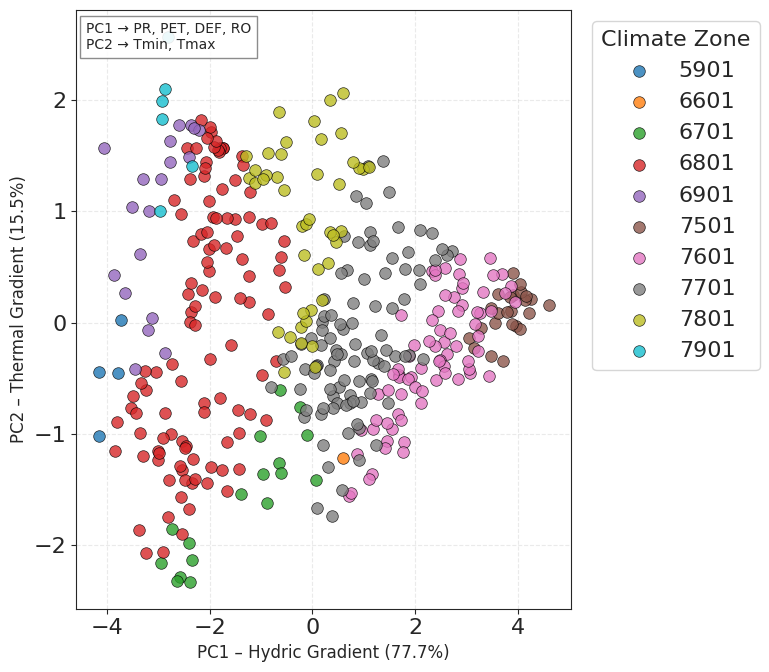

In [9]:
# =========================================================
# Principal Component Analysis (PCA) of Climate Zones
# PC1 → Hydric gradient
# PC2 → Thermal gradient
# =========================================================

# =========================================================
# Variables selected for PCA
# =========================================================
# PR    = precipitation
# PET   = potential evapotranspiration
# DEF   = water deficit
# RO    = runoff/surplus
# TMMN  = minimum temperature
# TMMX  = maximum temperature

vars_pca = ['pr', 'pet', 'def', 'ro', 'tmmn', 'tmmx']

# =========================================================
# Remove rows with missing values
# =========================================================
df_clima_cleaned = df_clima.dropna(subset=vars_pca).copy()

# =========================================================
# Extract explanatory variables
# =========================================================
X = df_clima_cleaned[vars_pca].values

# =========================================================
# Standardization (z-score normalization)
# mean = 0 ; standard deviation = 1
# =========================================================
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# =========================================================
# Principal Component Analysis
# Retaining the first two principal components
# =========================================================
pca = PCA(n_components=2)

pcs = pca.fit_transform(X_std)

# =========================================================
# Create dataframe with PCA scores
# =========================================================
df_pca = df_clima_cleaned[['ZC']].copy()

df_pca['PC1'] = pcs[:, 0]
df_pca['PC2'] = pcs[:, 1]

# =========================================================
# Explained variance
# =========================================================
pc1_var = pca.explained_variance_ratio_[0] * 100
pc2_var = pca.explained_variance_ratio_[1] * 100

# =========================================================
# Plot configuration
# =========================================================
plt.figure(figsize=(8, 7))

# =========================================================
# Scatter plot by Climate Zone
# =========================================================
for zc, g in df_pca.groupby('ZC'):

    plt.scatter(
        g['PC1'],
        g['PC2'],
        s=70,
        alpha=0.80,
        edgecolor='black',
        linewidth=0.5,
        label=str(zc)
    )

# =========================================================
# Axis labels
# =========================================================
plt.xlabel(
    f'PC1 – Hydric Gradient ({pc1_var:.1f}%)',
    fontsize=12
)

plt.ylabel(
    f'PC2 – Thermal Gradient ({pc2_var:.1f}%)',
    fontsize=12
)

# =========================================================
# Add interpretation annotation
# =========================================================
plt.text(
    0.02,
    0.98,
    'PC1 → PR, PET, DEF, RO\n'
    'PC2 → Tmin, Tmax',
    transform=plt.gca().transAxes,
    fontsize=10,
    verticalalignment='top',
    bbox=dict(
        facecolor='white',
        edgecolor='gray',
        alpha=0.9
    )
)

# =========================================================
# Grid
# =========================================================
plt.grid(
    True,
    linestyle='--',
    alpha=0.4
)

# =========================================================
# Legend
# =========================================================
plt.legend(
    title='Climate Zone',
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    frameon=True
)

# =========================================================
# Improve layout
# =========================================================
plt.tight_layout()

# =========================================================
# Save figure
# =========================================================
plt.savefig(
    'Figure6.png',
    dpi=600,
    bbox_inches='tight'
)

# =========================================================
# Display figure
# =========================================================
plt.show()

In [10]:
df_pca

variavel,ZC,PC1,PC2
0,7601,1.916129,-0.491461
1,6801,-0.912916,-0.873711
2,6801,-3.374582,-1.860397
3,6801,-3.490019,-0.659700
4,6801,-0.604660,0.587363
...,...,...,...
395,6801,-2.100749,1.384763
396,6801,-2.147001,0.289785
397,6901,-2.946381,1.290270
398,7601,1.096815,-1.400008


#Maps of variables by ZC

Processing Climatic Zone 5901


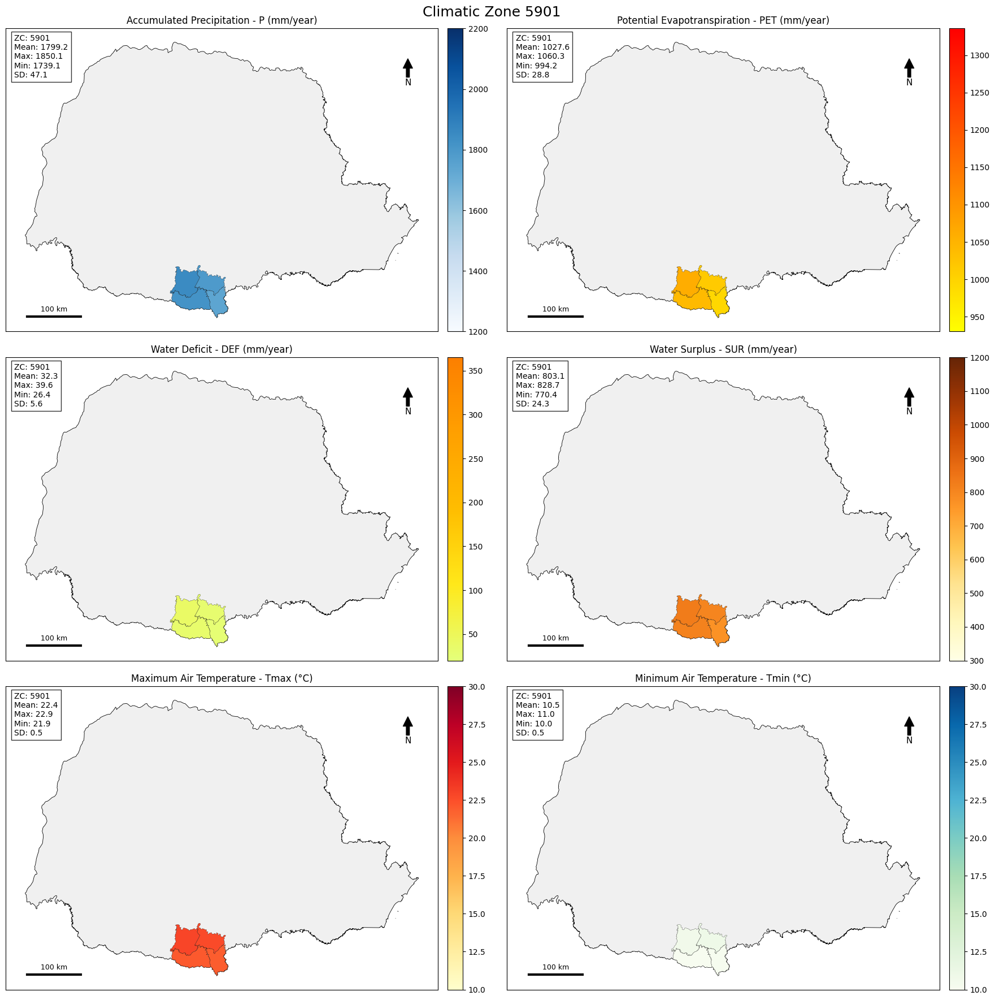

Processing Climatic Zone 6601


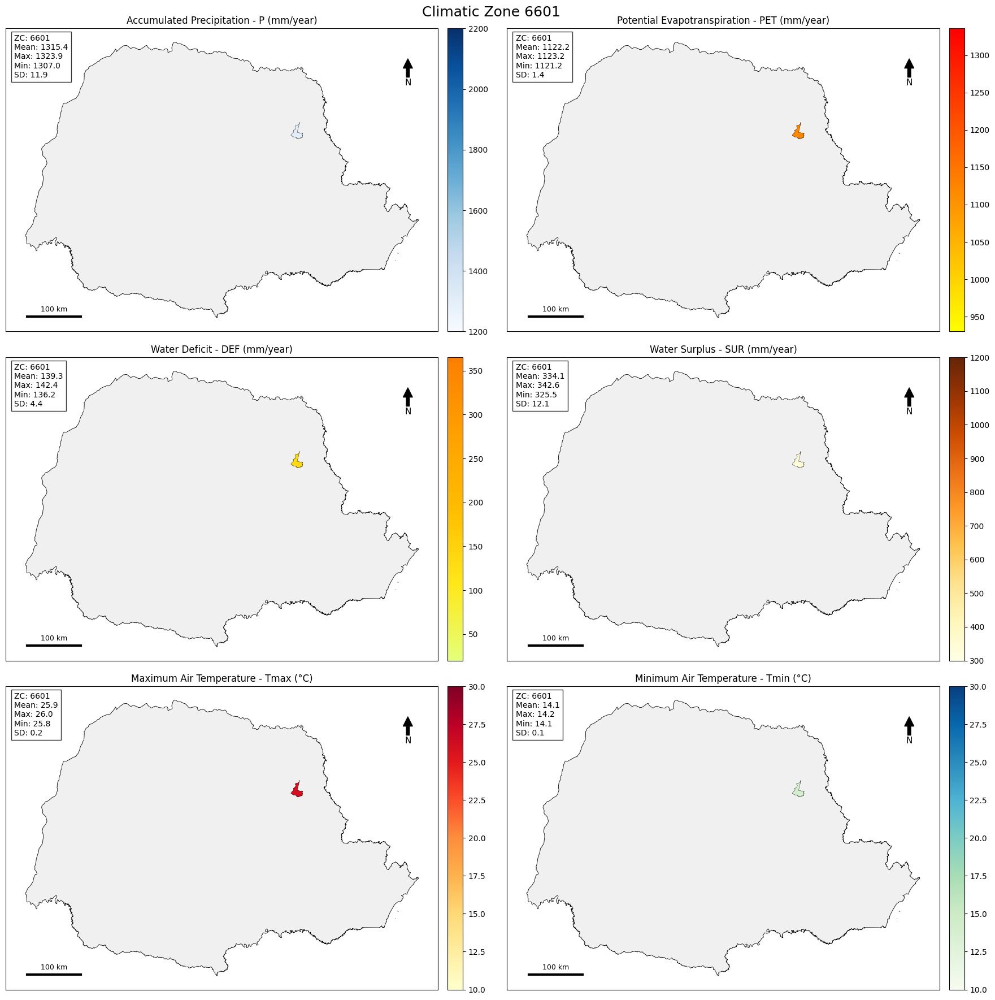

Processing Climatic Zone 6701


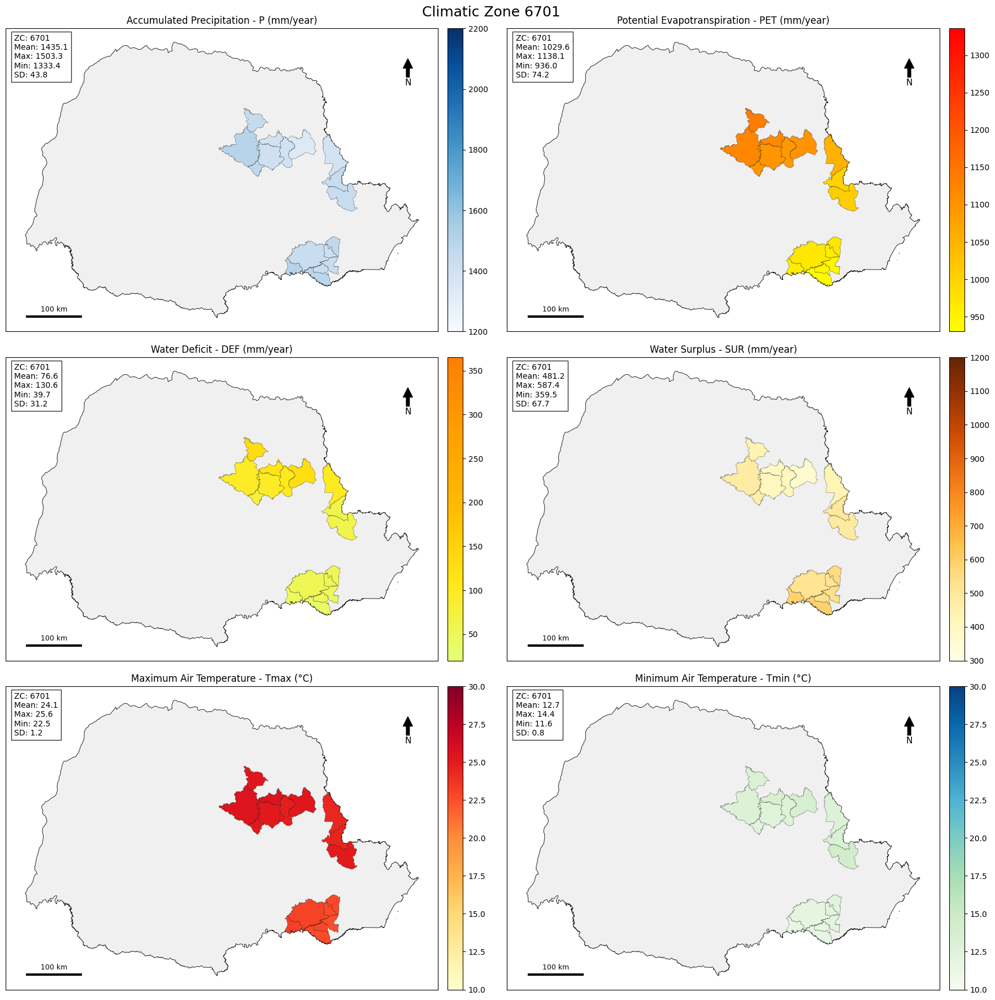

Processing Climatic Zone 6801


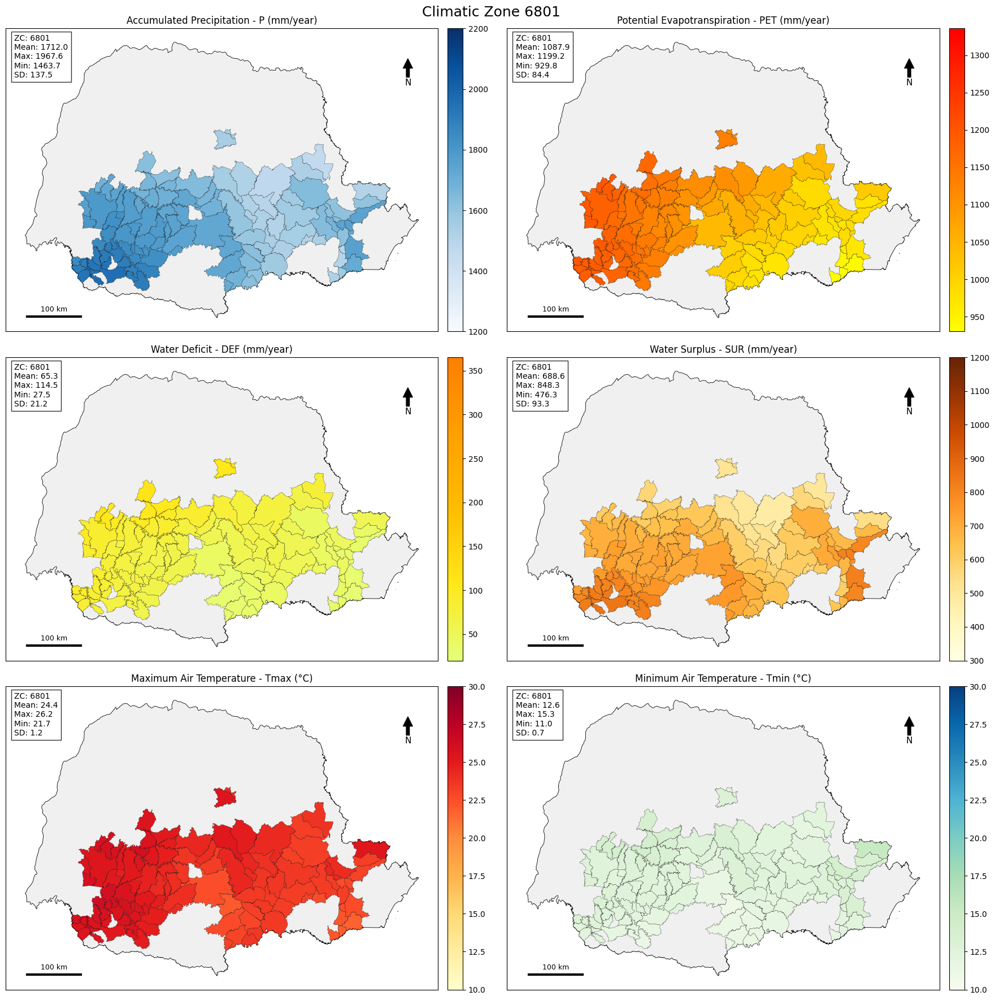

Processing Climatic Zone 6901


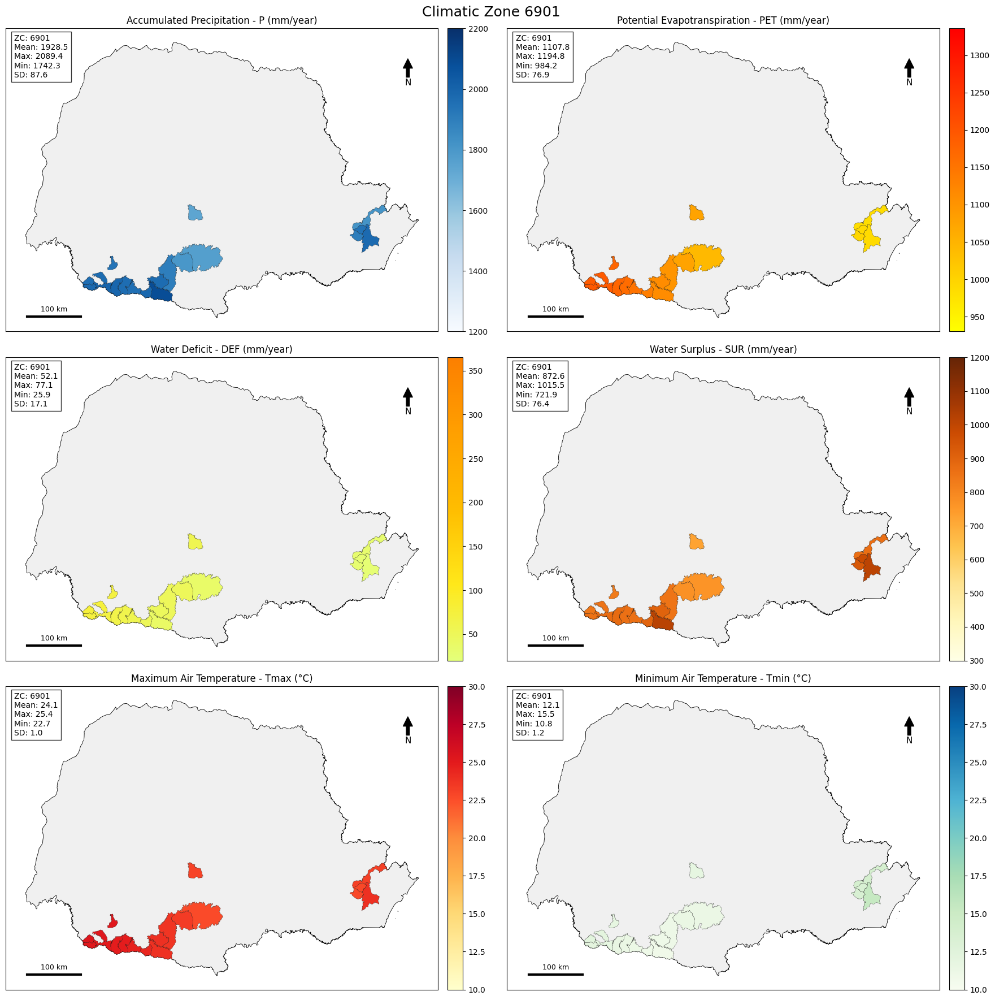

Processing Climatic Zone 7501


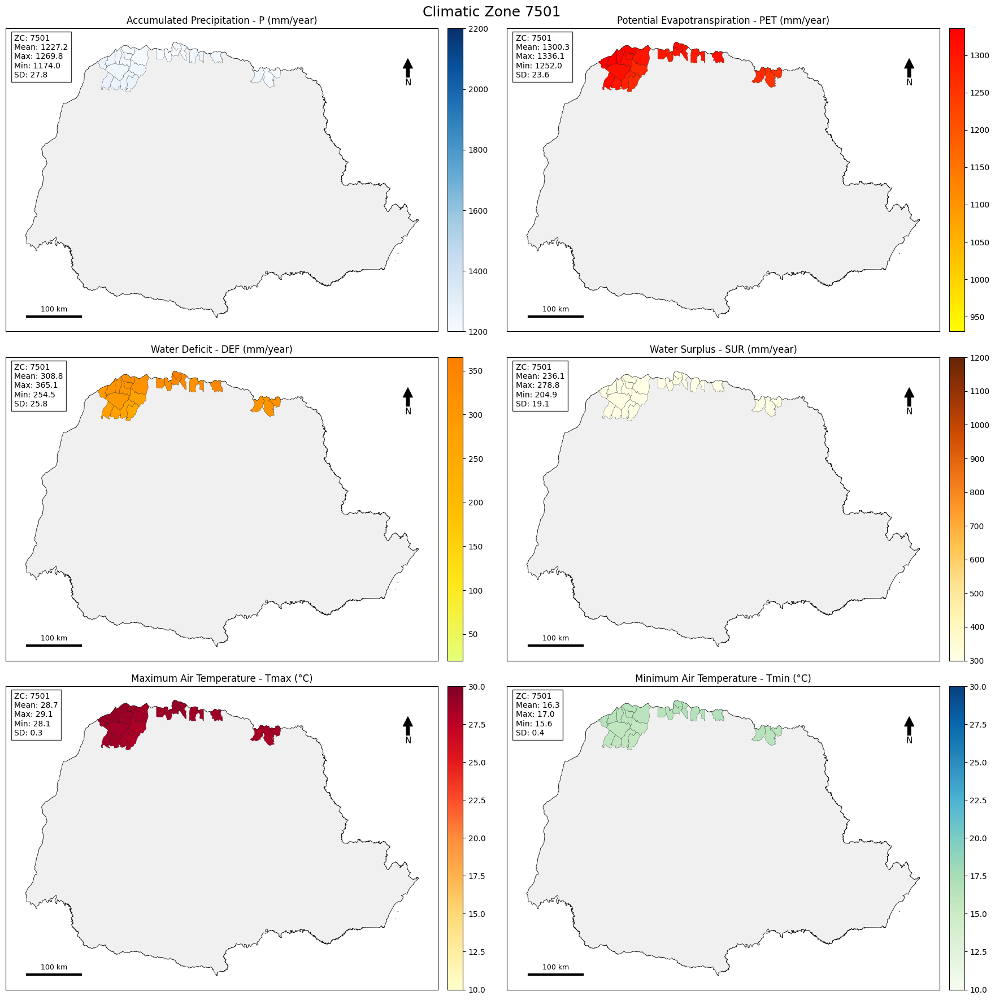

Processing Climatic Zone 7601


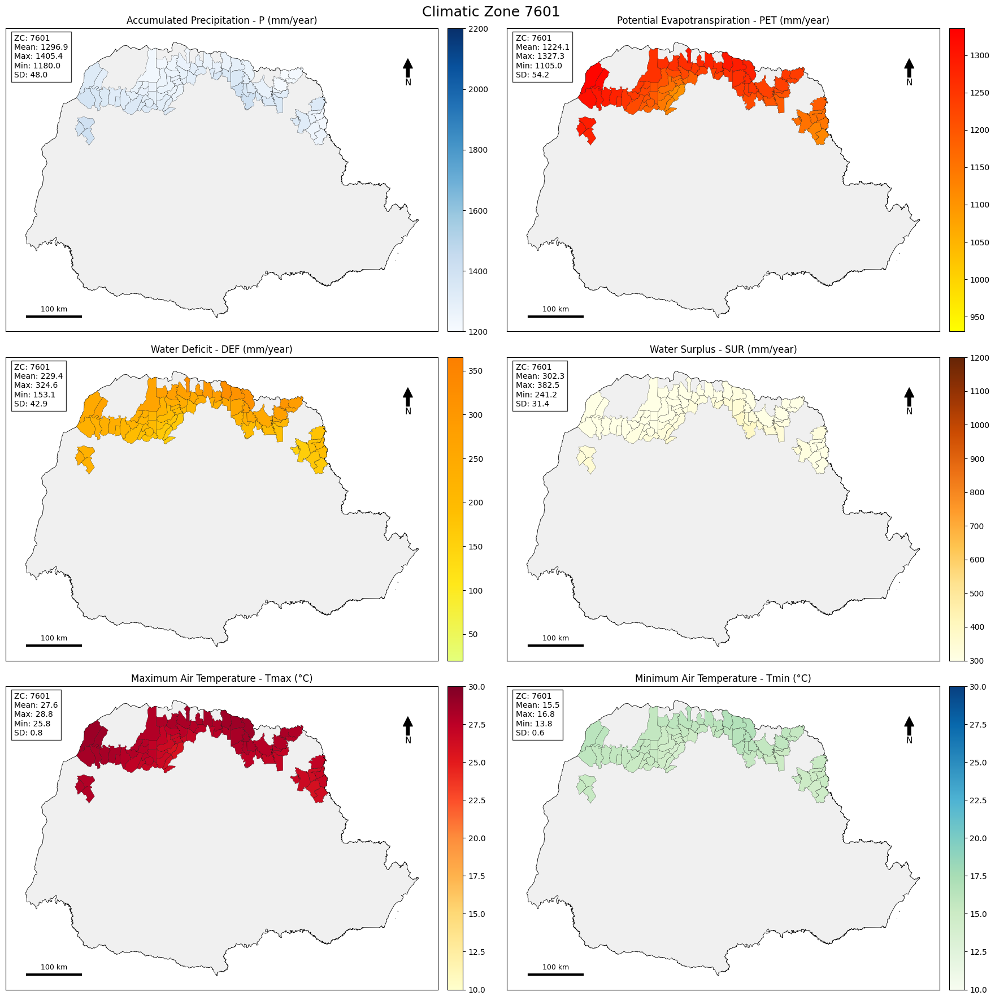

Processing Climatic Zone 7701


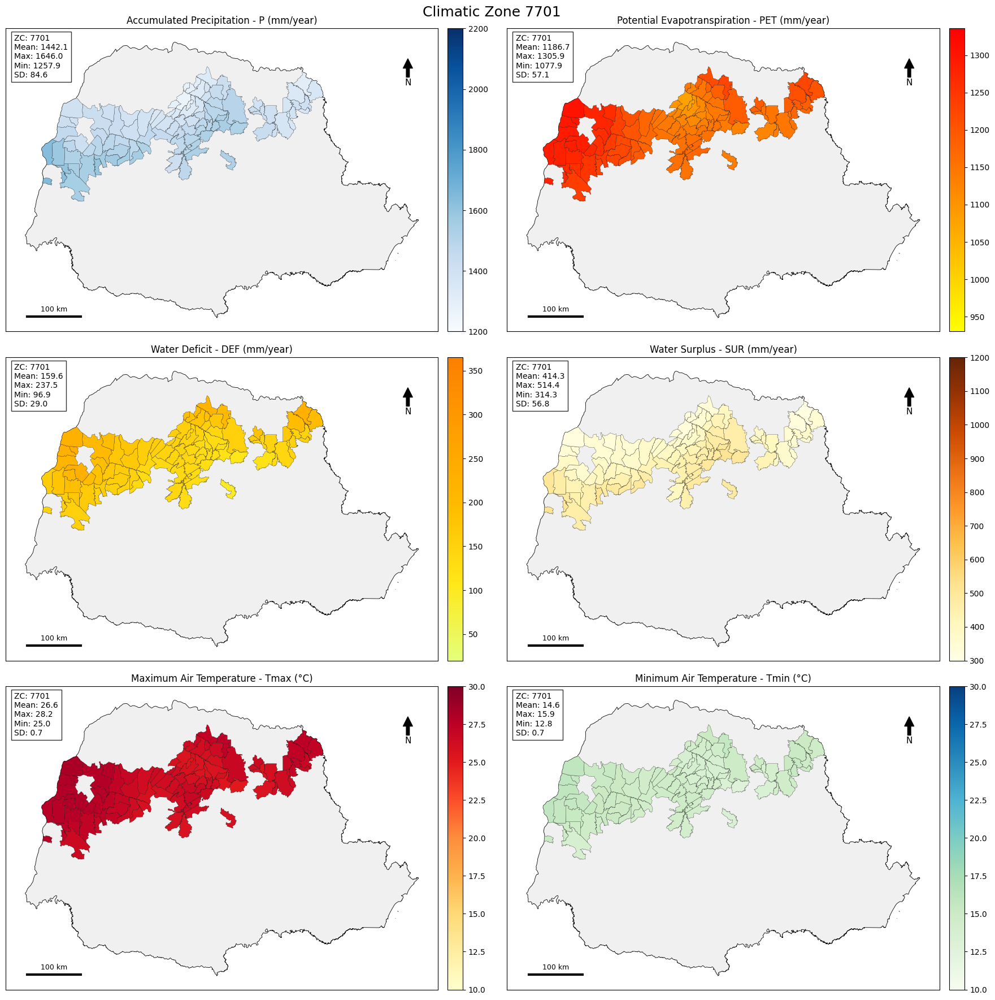

Processing Climatic Zone 7801


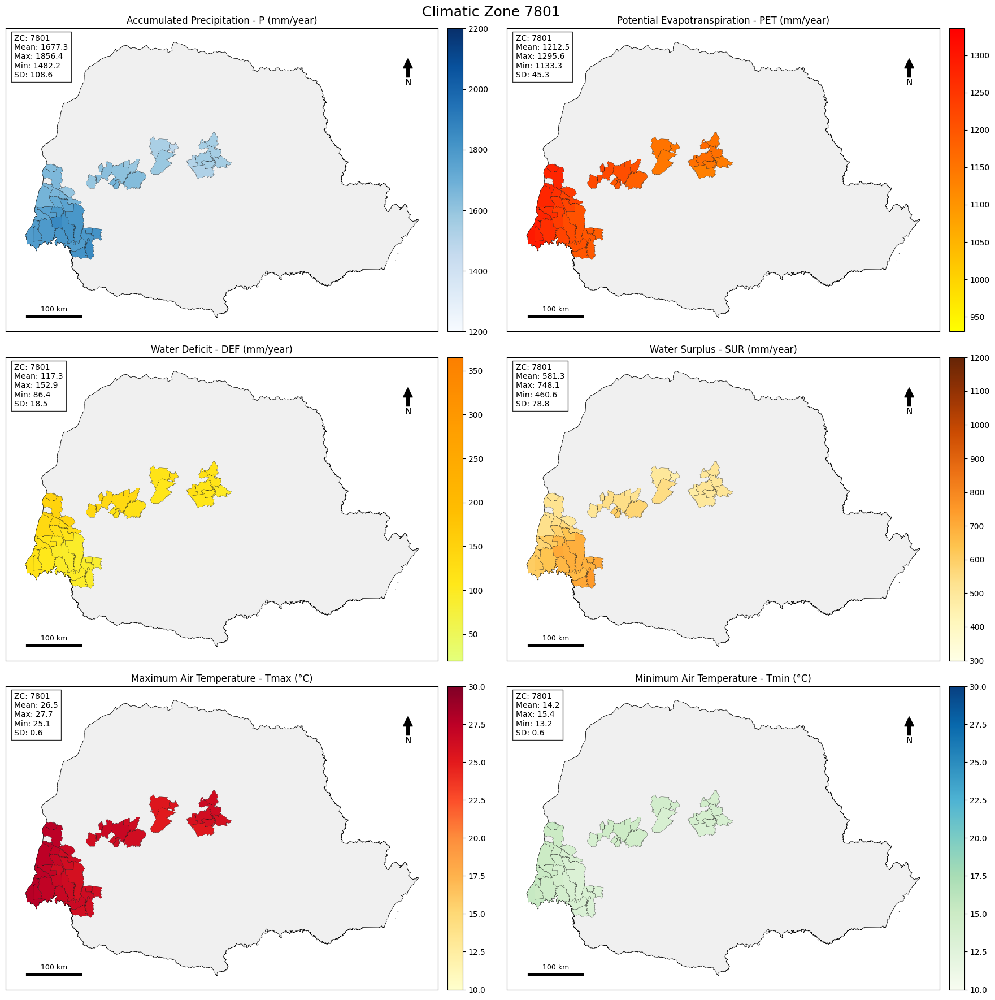

Processing Climatic Zone 7901


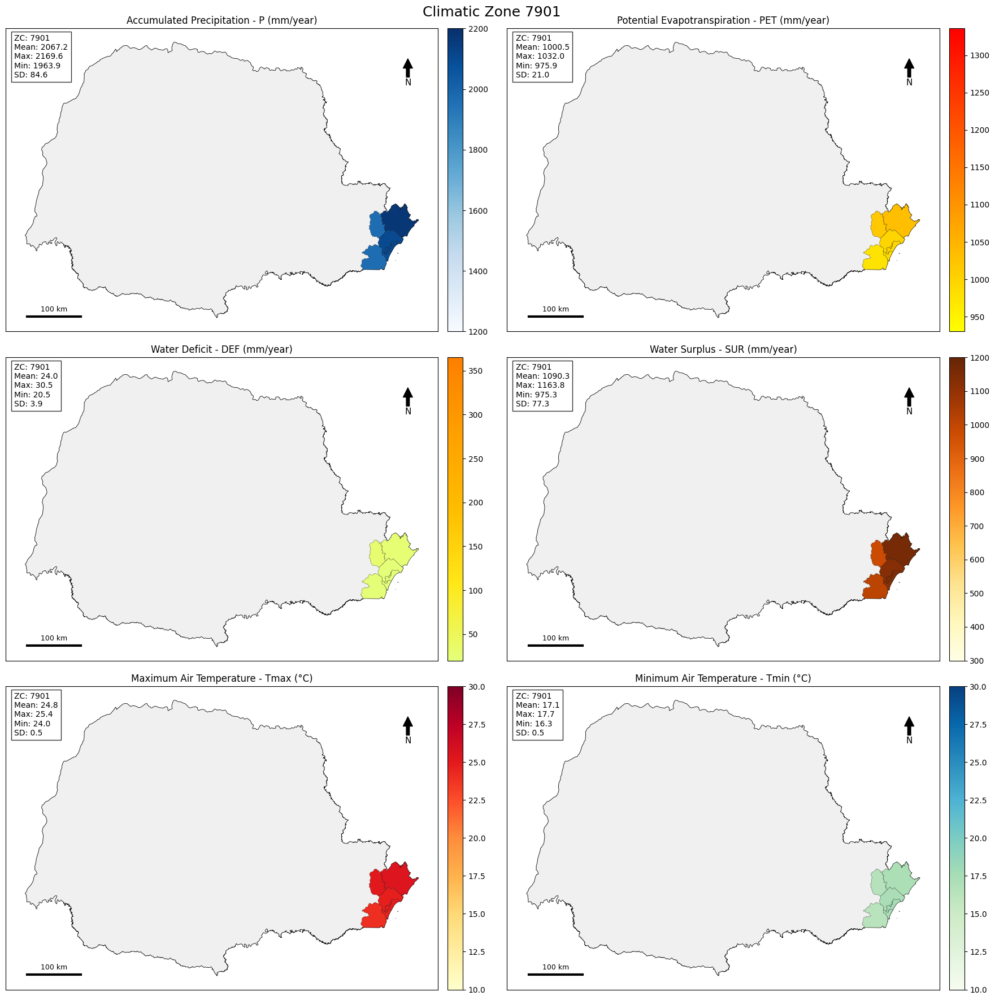

Processing completed.


In [ ]:
url = "https://raw.githubusercontent.com/fcoliveira-utfpr/climate_parana/refs/heads/main/dados_concatenados_zc.csv"
df = pd.read_csv(url, sep=",")

# =========================================================
# CLIMATIC MULTIPLOT BY CLIMATIC ZONE (USING LOCAL DATAFRAME)
# WITH PARANÁ STATE BACKGROUND
# =========================================================

warnings.filterwarnings("ignore")

# =====================================================
# AUXILIARY FUNCTIONS
# =====================================================

def add_north_arrow(ax, x=0.93, y=0.9, size=0.08):
    """
    Adds a north arrow to the map.
    """
    ax.annotate(
        'N',
        xy=(x, y),
        xytext=(x, y - size),
        arrowprops=dict(facecolor='black', width=4, headwidth=12),
        ha='center',
        va='center',
        fontsize=11,
        xycoords=ax.transAxes
    )

def add_scalebar(ax, length_km=100, loc=(0.05, 0.05), linewidth=3):
    """
    Adds a scale bar in kilometers.
    """
    x0, y0 = loc
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Approximate conversion from km to degrees
    length_deg = length_km / 111.0

    x_start = xlim[0] + x0 * (xlim[1] - xlim[0])
    y_start = ylim[0] + y0 * (ylim[1] - ylim[0])

    ax.plot(
        [x_start, x_start + length_deg],
        [y_start, y_start],
        color='black',
        linewidth=linewidth,
        zorder=20
    )

    ax.text(
        x_start + length_deg / 2,
        y_start + 0.01 * (ylim[1] - ylim[0]),
        f"{length_km} km",
        ha='center',
        va='bottom',
        fontsize=9
    )

# =====================================================
# VARIABLE SPECIFICATIONS
# =====================================================

VAR_SPECS = {
    'pr':   dict(title="Accumulated Precipitation - P",          unit="mm/year", cmap='Blues',    vmin=1200, vmax=2200),
    'pet':  dict(title="Potential Evapotranspiration - PET",     unit="mm/year", cmap='autumn_r', vmin=930,  vmax=1336),
    'def':  dict(title="Water Deficit - DEF",                    unit="mm/year", cmap='Wistia',   vmin=20,   vmax=365),
    'ro':   dict(title="Water Surplus - SUR",                    unit="mm/year", cmap='YlOrBr',   vmin=300,  vmax=1200),
    'tmmx': dict(title="Maximum Air Temperature - Tmax",         unit="°C",      cmap='YlOrRd',   vmin=10,   vmax=30),
    'tmmn': dict(title="Minimum Air Temperature - Tmin",         unit="°C",      cmap='GnBu',     vmin=10,   vmax=30),
}

vars_plot = list(VAR_SPECS.keys())

# =====================================================
# LOAD GEOMETRIES
# =====================================================

mun_pr = read_municipality(code_muni="PR", year=2020)
parana = read_state(code_state='PR', year=2020)

# Standardize CRS
parana = parana.to_crs(mun_pr.crs)

# =====================================================
# STANDARDIZE MUNICIPALITY NAMES
# =====================================================

mun_pr['municipio'] = (
    mun_pr['name_muni']
    .str.upper()
    .str.normalize('NFKD')
    .str.encode('ascii', errors='ignore')
    .str.decode('utf-8')
)

df['municipio'] = (
    df['municipio']
    .str.upper()
    .str.normalize('NFKD')
    .str.encode('ascii', errors='ignore')
    .str.decode('utf-8')
)

# =====================================================
# CLIMATIC ZONES
# =====================================================

zonas = sorted(df['ZC'].dropna().unique())

# =====================================================
# MAIN LOOP
# =====================================================

for zona in zonas:

    print(f"Processing Climatic Zone {zona}")

    fig, axes = plt.subplots(3, 2, figsize=(18, 18))
    axes = axes.ravel()

    df_zona = df[df['ZC'] == zona]

    stats_dict = {"Climatic Zone": zona}

    # ----------------------------------------------
    # VARIABLE LOOP
    # ----------------------------------------------
    for ax, var in zip(axes, vars_plot):

        spec = VAR_SPECS[var]

        df_var = df_zona[df_zona['variavel'] == var]

        gdf = mun_pr.merge(df_var, on='municipio', how='left')

        serie = gdf['valor'].astype(float)

        # Compute statistics
        stats_dict[var] = serie.mean()

        # ------------------------------------------
        # PARANÁ BACKGROUND
        # ------------------------------------------
        parana.plot(
            ax=ax,
            color='#f0f0f0',
            edgecolor='black',
            linewidth=0.6,
            zorder=0
        )

        # ------------------------------------------
        # MUNICIPAL MAP
        # ------------------------------------------
        gdf.plot(
            column='valor',
            cmap=spec['cmap'],
            vmin=spec['vmin'],
            vmax=spec['vmax'],
            edgecolor='black',
            linewidth=0.2,
            ax=ax,
            zorder=1
        )

        # ------------------------------------------
        # COLORBAR
        # ------------------------------------------
        norm = colors.Normalize(vmin=spec['vmin'], vmax=spec['vmax'])
        sm = cm.ScalarMappable(norm=norm, cmap=plt.get_cmap(spec['cmap']))
        sm.set_array([])

        fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.02)

        # ------------------------------------------
        # STATISTICS TEXT BOX
        # ------------------------------------------
        txt = (
            f"ZC: {zona}\n"
            f"Mean: {serie.mean():.1f}\n"
            f"Max: {serie.max():.1f}\n"
            f"Min: {serie.min():.1f}\n"
            f"SD: {serie.std():.1f}"
        )

        ax.text(
            0.02, 0.98, txt,
            transform=ax.transAxes,
            va='top',
            bbox=dict(facecolor='white', alpha=0.8)
        )

        # Cartographic elements
        add_scalebar(ax)
        add_north_arrow(ax)

        ax.set_title(f"{spec['title']} ({spec['unit']})")
        ax.set_xticks([])
        ax.set_yticks([])

    # ----------------------------------------------
    # FINAL ADJUSTMENTS
    # ----------------------------------------------
    plt.suptitle(f"Climatic Zone {zona}", fontsize=18)
    plt.tight_layout()

    # Save figure
    plt.savefig(f"climate_zone_{zona}.png", dpi=300)
    plt.show()

    # ----------------------------------------------
    # SAVE CSV WITH STATISTICS
    # ----------------------------------------------
    pd.DataFrame([stats_dict]).to_csv(
        f"zone_data_{zona}.csv",
        index=False
    )

print("Processing completed.")
